<a href="https://colab.research.google.com/github/kotireddys/masters_thesis/blob/main/Thesis_3_Semanticseg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# =============================================================
# 🗜️ 1. Unzip + Inspect Roboflow Semantic Segmentation Dataset
# =============================================================
import os, zipfile, glob, cv2, numpy as np
from tqdm import tqdm

# --- (A) Path to your uploaded ZIP ---
ZIP_PATH = "/content/drive/MyDrive/Terrain_Classification.v1i.png-mask-semantic.zip"   # ← change if needed
EXTRACT_PATH = "/content/drive/MyDrive/terrain_v3"  # output folder
os.makedirs(EXTRACT_PATH, exist_ok=True)

# --- (B) Unzip dataset ---
print("📦 Extracting dataset...")
with zipfile.ZipFile(ZIP_PATH, 'r') as zip_ref:
    zip_ref.extractall(EXTRACT_PATH)
print("✅ Extraction complete:", EXTRACT_PATH)

# --- (C) Show structure (first 3 files per folder) ---
print("\n📂 Folder structure:")
for root, dirs, files in os.walk(EXTRACT_PATH):
    level = root.replace(EXTRACT_PATH, "").count(os.sep)
    indent = " " * 2 * level
    print(f"{indent}{os.path.basename(root)}/")
    for f in files[:3]:
        print(f"{indent}  ↳ {f}")
    if level > 2: break

# =============================================================
# 🔍 2. Detect image & mask folders automatically
# =============================================================
image_folders = [d for d in glob.glob(f"{EXTRACT_PATH}/**/images", recursive=True)]
mask_folders  = [d for d in glob.glob(f"{EXTRACT_PATH}/**/masks",  recursive=True)] + \
                [d for d in glob.glob(f"{EXTRACT_PATH}/**/labels", recursive=True)]

print("\n🖼️ Image folders found:", image_folders or "❌ none")
print("🎭 Mask folders found :", mask_folders or "❌ none")

# Guess split names if they exist
splits = ["train", "valid", "test"]
found_splits = [s for s in splits if any(s in p for p in image_folders + mask_folders)]
print("📚 Detected splits:", found_splits or "❌ none")

# =============================================================
# 🧪 3. Sample image–mask check
# =============================================================
def show_sample(img_path, mask_path):
    import matplotlib.pyplot as plt
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    mask = cv2.imread(mask_path, 0)
    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1); plt.imshow(img);  plt.title("Image"); plt.axis('off')
    plt.subplot(1,2,2); plt.imshow(mask, cmap='nipy_spectral'); plt.title("Mask"); plt.axis('off')
    plt.show()
    print("🧩 Image shape:", img.shape, "| Mask shape:", mask.shape)
    print("🎨 Unique mask values:", np.unique(mask))

# Try one sample if possible
try:
    img_sample = glob.glob(f"{EXTRACT_PATH}/**/train/images/*.*", recursive=True)[0]
    mask_sample = glob.glob(f"{EXTRACT_PATH}/**/train/masks/*.*", recursive=True)[0]
    show_sample(img_sample, mask_sample)
except Exception as e:
    print("⚠️ Sample visualization skipped:", e)

# =============================================================
# 📊 4. Scan ALL masks to count unique class IDs
# =============================================================
print("\n🔎 Scanning all masks for unique class IDs ...")
mask_dirs = [p for p in mask_folders if any(s in p for s in splits)] or mask_folders
all_vals = set()

for mdir in mask_dirs:
    for m in tqdm(glob.glob(mdir + "/*.png")):
        mask = cv2.imread(m, cv2.IMREAD_GRAYSCALE)
        if mask is not None:
            all_vals.update(np.unique(mask).tolist())

print("\n🎭 Unique class values across dataset:", sorted(all_vals))
print("📈 Total number of semantic classes:", len(all_vals))


📦 Extracting dataset...
✅ Extraction complete: /content/drive/MyDrive/terrain_v3

📂 Folder structure:
terrain_v3/
  ↳ README.dataset.txt
  ↳ README.roboflow.txt
  test/
    ↳ _classes.csv
    ↳ tile_012_png.rf.54bf7265a2925347f8826e19069c73ee.jpg
    ↳ tile_012_png.rf.54bf7265a2925347f8826e19069c73ee_mask.png
  train/
    ↳ _classes.csv
    ↳ tile_001_png.rf.f366b2a3648920f28b4c549ea7a6cdc3.jpg
    ↳ tile_001_png.rf.f366b2a3648920f28b4c549ea7a6cdc3_mask.png
  valid/
    ↳ _classes.csv
    ↳ tile_002_png.rf.abd4ff7ea8c7727fe24d442988ccb7a7.jpg
    ↳ tile_002_png.rf.abd4ff7ea8c7727fe24d442988ccb7a7_mask.png

🖼️ Image folders found: ❌ none
🎭 Mask folders found : ❌ none
📚 Detected splits: ❌ none
⚠️ Sample visualization skipped: list index out of range

🔎 Scanning all masks for unique class IDs ...

🎭 Unique class values across dataset: []
📈 Total number of semantic classes: 0


In [ ]:
# =============================================================
# ✅ Verify and Summarize Integer-Encoded Masks from Roboflow
# =============================================================
import os, glob, cv2, numpy as np, pandas as pd
from tqdm import tqdm

BASE_PATH = "/content/drive/MyDrive/terrain_v3"
splits = ["train", "valid", "test"]

# --- Read class map from _classes.csv ---
classes_csv = os.path.join(BASE_PATH, "train", "_classes.csv")
df = pd.read_csv(classes_csv)
print("\n🎯 Loaded class map:")
print(df)

num_classes = df["Pixel Value"].max() + 1
print(f"\n✅ Detected {num_classes} classes (0–{num_classes-1})")

# --- Scan masks to confirm pixel values ---
all_vals = set()
for split in splits:
    mask_dir = os.path.join(BASE_PATH, split, "masks")
    if not os.path.exists(mask_dir):
        print(f"⚠️ Skipping missing {split}/masks")
        continue
    for m in glob.glob(mask_dir + "/*.png"):
        mask = cv2.imread(m, cv2.IMREAD_GRAYSCALE)
        if mask is not None:
            all_vals.update(np.unique(mask).tolist())

print("\n🎨 Unique pixel values across dataset:", sorted(all_vals))
print("📈 Total detected classes:", len(all_vals))

# --- Sanity check ---
if max(all_vals) > num_classes - 1:
    print(f"⚠️ WARNING: Mask contains IDs higher than expected ({max(all_vals)} > {num_classes-1})")
else:
    print("✅ All masks are within expected range.")

# --- Optional visualization of one example ---
import matplotlib.pyplot as plt
example_mask = glob.glob(f"{BASE_PATH}/train/masks/*.png")[0]
mask = cv2.imread(example_mask, cv2.IMREAD_GRAYSCALE)
plt.imshow(mask, cmap='nipy_spectral')
plt.title("Example Mask (class indices)")
plt.axis("off")
plt.show()




🎯 Loaded class map:
    Pixel Value           Class
0             0      background
1             1       Flat Sand
2             2       Grassland
3             3        Obstacle
4             4     Parking lot
5             5        Pavement
6             6   Railway Track
7             7            Road
8             8      Sand Heaps
9             9           Trees
10           10         Unknown

✅ Detected 11 classes (0–10)
⚠️ Skipping missing train/masks
⚠️ Skipping missing valid/masks
⚠️ Skipping missing test/masks

🎨 Unique pixel values across dataset: []
📈 Total detected classes: 0


ValueError: max() iterable argument is empty

In [ ]:
# =============================================================
# 🧹 Reorganize Roboflow Dataset into /images and /masks folders
# =============================================================
import os, glob, shutil, cv2, numpy as np
from tqdm import tqdm

BASE_PATH = "/content/drive/MyDrive/terrain_v3"
splits = ["train", "valid", "test"]

for split in splits:
    split_path = os.path.join(BASE_PATH, split)
    img_dir = os.path.join(split_path, "images")
    mask_dir = os.path.join(split_path, "masks")
    os.makedirs(img_dir, exist_ok=True)
    os.makedirs(mask_dir, exist_ok=True)

    print(f"\n🔧 Organizing {split} split...")
    for f in tqdm(glob.glob(f"{split_path}/*.*")):
        fname = os.path.basename(f)
        if fname.endswith(".jpg") or (fname.endswith(".png") and "_mask" not in fname):
            shutil.move(f, os.path.join(img_dir, fname))
        elif "_mask" in fname:
            shutil.move(f, os.path.join(mask_dir, fname))

print("\n✅ Dataset reorganized successfully.")

# =============================================================
# 🔍 Verify mask files and class indices
# =============================================================
import pandas as pd

classes_csv = os.path.join(BASE_PATH, "train", "_classes.csv")
df = pd.read_csv(classes_csv)
print("\n🎯 Loaded class map:")
print(df)

num_classes = df["Pixel Value"].max() + 1
print(f"\n✅ Detected {num_classes} classes (0–{num_classes-1})")

all_vals = set()
for split in splits:
    mask_dir = os.path.join(BASE_PATH, split, "masks")
    for m in glob.glob(mask_dir + "/*.png"):
        mask = cv2.imread(m, cv2.IMREAD_GRAYSCALE)
        if mask is not None:
            all_vals.update(np.unique(mask).tolist())

print("\n🎨 Unique pixel values across dataset:", sorted(all_vals))
print("📈 Total detected classes:", len(all_vals))



🔧 Organizing train split...


100%|██████████| 737/737 [00:03<00:00, 226.39it/s]



🔧 Organizing valid split...


100%|██████████| 211/211 [00:00<00:00, 215.13it/s]



🔧 Organizing test split...


100%|██████████| 105/105 [00:00<00:00, 205.55it/s]



✅ Dataset reorganized successfully.

🎯 Loaded class map:
    Pixel Value           Class
0             0      background
1             1       Flat Sand
2             2       Grassland
3             3        Obstacle
4             4     Parking lot
5             5        Pavement
6             6   Railway Track
7             7            Road
8             8      Sand Heaps
9             9           Trees
10           10         Unknown

✅ Detected 11 classes (0–10)

🎨 Unique pixel values across dataset: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
📈 Total detected classes: 11


In [ ]:
# =============================================================
# 🔧 1. Setup paths and configuration
# =============================================================
# =============================================================
# 🧱 1. Imports
# =============================================================
import os, yaml, cv2, numpy as np, torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models
import albumentations as A
from albumentations.pytorch import ToTensorV2
from tqdm import tqdm
import wandb

# =============================================================
# 📁 2. Paths and YAML Configuration
# =============================================================
BASE_PATH = "/content/drive/MyDrive/terrain_v3"
YAML_PATH = os.path.join(BASE_PATH, "terrain_v3.yaml")

yaml_config = {
    "path": {
        "train": f"{BASE_PATH}/train/images",
        "val":   f"{BASE_PATH}/valid/images",
        "test":  f"{BASE_PATH}/test/images"
    },
    "mask_path": {
        "train": f"{BASE_PATH}/train/masks",
        "val":   f"{BASE_PATH}/valid/masks",
        "test":  f"{BASE_PATH}/test/masks"
    },
    "nc": 11,
    "names": [
        "background", "Flat Sand", "Grassland", "Obstacle",
        "Parking lot", "Pavement", "Railway Track", "Road",
        "Sand Heaps", "Trees", "Unknown"
    ]
}

with open(YAML_PATH, "w") as f:
    yaml.safe_dump(yaml_config, f)

print("✅ YAML created at:", YAML_PATH)

# =============================================================
# 🧩 3. Dataset Class (Dynamic Mask Finder)
# =============================================================
class SegmentationDataset(Dataset):
    def __init__(self, img_dir, mask_dir, transforms=None):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.transforms = transforms
        self.images = sorted([f for f in os.listdir(img_dir) if f.endswith((".jpg", ".png"))])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = self.images[idx]
        img_path = os.path.join(self.img_dir, img_name)

        # Dynamically find mask with matching base name
        base = img_name.split('.')[0]
        possible_masks = [
            f for f in os.listdir(self.mask_dir)
            if f.startswith(base) and f.endswith("_mask.png")
        ]
        if not possible_masks:
            raise FileNotFoundError(f"No mask found for image {img_name}")
        mask_path = os.path.join(self.mask_dir, possible_masks[0])

        # Load image + mask
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        if img is None or mask is None:
            raise ValueError(f"Could not read image or mask for {img_name}")

        if mask.shape[:2] != img.shape[:2]:
            mask = cv2.resize(mask, (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)

        if self.transforms:
            aug = self.transforms(image=img, mask=mask)
            img, mask = aug["image"].float(), aug["mask"].long()

        return img, mask

# =============================================================
# 🎨 4. Transforms
# =============================================================
def get_transforms():
    train_tf = A.Compose([
        A.Resize(512, 512),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.2),
        A.RandomRotate90(p=0.3),
        A.RandomBrightnessContrast(p=0.3),
        ToTensorV2()
    ])
    val_tf = A.Compose([
        A.Resize(512, 512),
        ToTensorV2()
    ])
    return train_tf, val_tf

# =============================================================
# ⚙️ 5. DataLoaders
# =============================================================
with open(YAML_PATH) as f:
    cfg = yaml.safe_load(f)

train_dir = cfg["path"]["train"]
val_dir   = cfg["path"]["val"]
train_mask_dir = cfg["mask_path"]["train"]
val_mask_dir   = cfg["mask_path"]["val"]
NUM_CLASSES = cfg["nc"]
CLASS_NAMES = cfg["names"]

train_tf, val_tf = get_transforms()
train_ds = SegmentationDataset(train_dir, train_mask_dir, train_tf)
val_ds   = SegmentationDataset(val_dir, val_mask_dir, val_tf)

train_loader = DataLoader(train_ds, batch_size=4, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_ds, batch_size=2, shuffle=False)

print(f"✅ Dataset loaded: {len(train_ds)} train / {len(val_ds)} val samples")

# =============================================================
# 🧮 6. Model Setup
# =============================================================
device = "cuda" if torch.cuda.is_available() else "cpu"
print("🖥️ Using device:", device)

model = models.segmentation.deeplabv3_resnet50(weights=None, aux_loss=None)
model.classifier[4] = nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# =============================================================
# 📊 7. Initialize W&B
# =============================================================
wandb.init(project="UAV_LandingZone_Segmentation", name="DeepLabv3_Terrain_v3")
wandb.config.update({
    "epochs": 30,
    "batch_size": 4,
    "lr": 1e-4,
    "num_classes": NUM_CLASSES,
    "architecture": "DeepLabv3-ResNet50"
})

# =============================================================
# 🚀 8. Training Loop
# =============================================================
EPOCHS = 30

for epoch in range(EPOCHS):
    model.train()
    train_loss = 0
    for imgs, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS}"):
        imgs, masks = imgs.to(device), masks.to(device)
        out = model(imgs)["out"]

        loss = criterion(out, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss += loss.item()

    train_loss /= len(train_loader)
    wandb.log({"Train Loss": train_loss})
    print(f"Epoch [{epoch+1}/{EPOCHS}] - Train Loss: {train_loss:.4f}")

print("\n✅ Training complete!")
torch.save(model.state_dict(), os.path.join(BASE_PATH, "deeplabv3_terrain_v3.pth"))
wandb.finish()
print("💾 Model saved successfully.")


✅ YAML created at: /content/drive/MyDrive/terrain_v3/terrain_v3.yaml
✅ Dataset loaded: 368 train / 105 val samples
🖥️ Using device: cuda


/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter:

 ··········


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: kotireddyr3 (kotireddyr3-cranfield-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Epoch 1/30: 100%|██████████| 92/92 [00:25<00:00,  3.67it/s]


Epoch [1/30] - Train Loss: 1.6851


Epoch 2/30: 100%|██████████| 92/92 [00:09<00:00,  9.39it/s]


Epoch [2/30] - Train Loss: 1.3321


Epoch 3/30: 100%|██████████| 92/92 [00:09<00:00,  9.35it/s]


Epoch [3/30] - Train Loss: 1.1318


Epoch 4/30: 100%|██████████| 92/92 [00:09<00:00,  9.38it/s]


Epoch [4/30] - Train Loss: 1.0624


Epoch 5/30: 100%|██████████| 92/92 [00:09<00:00,  9.42it/s]


Epoch [5/30] - Train Loss: 1.0103


Epoch 6/30: 100%|██████████| 92/92 [00:09<00:00,  9.43it/s]


Epoch [6/30] - Train Loss: 0.9124


Epoch 7/30: 100%|██████████| 92/92 [00:09<00:00,  9.37it/s]


Epoch [7/30] - Train Loss: 0.8953


Epoch 8/30: 100%|██████████| 92/92 [00:09<00:00,  9.40it/s]


Epoch [8/30] - Train Loss: 0.8557


Epoch 9/30: 100%|██████████| 92/92 [00:09<00:00,  9.38it/s]


Epoch [9/30] - Train Loss: 0.7965


Epoch 10/30: 100%|██████████| 92/92 [00:09<00:00,  9.43it/s]


Epoch [10/30] - Train Loss: 0.7715


Epoch 11/30: 100%|██████████| 92/92 [00:09<00:00,  9.43it/s]


Epoch [11/30] - Train Loss: 0.7638


Epoch 12/30: 100%|██████████| 92/92 [00:09<00:00,  9.43it/s]


Epoch [12/30] - Train Loss: 0.6916


Epoch 13/30: 100%|██████████| 92/92 [00:10<00:00,  8.88it/s]


Epoch [13/30] - Train Loss: 0.7156


Epoch 14/30: 100%|██████████| 92/92 [00:09<00:00,  9.39it/s]


Epoch [14/30] - Train Loss: 0.6736


Epoch 15/30: 100%|██████████| 92/92 [00:09<00:00,  9.37it/s]


Epoch [15/30] - Train Loss: 0.5912


Epoch 16/30: 100%|██████████| 92/92 [00:09<00:00,  9.40it/s]


Epoch [16/30] - Train Loss: 0.6259


Epoch 17/30: 100%|██████████| 92/92 [00:09<00:00,  9.35it/s]


Epoch [17/30] - Train Loss: 0.6078


Epoch 18/30: 100%|██████████| 92/92 [00:09<00:00,  9.37it/s]


Epoch [18/30] - Train Loss: 0.5789


Epoch 19/30: 100%|██████████| 92/92 [00:09<00:00,  9.36it/s]


Epoch [19/30] - Train Loss: 0.5288


Epoch 20/30: 100%|██████████| 92/92 [00:09<00:00,  9.33it/s]


Epoch [20/30] - Train Loss: 0.5347


Epoch 21/30: 100%|██████████| 92/92 [00:09<00:00,  9.43it/s]


Epoch [21/30] - Train Loss: 0.5464


Epoch 22/30: 100%|██████████| 92/92 [00:09<00:00,  9.40it/s]


Epoch [22/30] - Train Loss: 0.5456


Epoch 23/30: 100%|██████████| 92/92 [00:09<00:00,  9.34it/s]


Epoch [23/30] - Train Loss: 0.5580


Epoch 24/30: 100%|██████████| 92/92 [00:09<00:00,  9.40it/s]


Epoch [24/30] - Train Loss: 0.4517


Epoch 25/30: 100%|██████████| 92/92 [00:10<00:00,  9.09it/s]


Epoch [25/30] - Train Loss: 0.4748


Epoch 26/30: 100%|██████████| 92/92 [00:09<00:00,  9.36it/s]


Epoch [26/30] - Train Loss: 0.4197


Epoch 27/30: 100%|██████████| 92/92 [00:09<00:00,  9.39it/s]


Epoch [27/30] - Train Loss: 0.4613


Epoch 28/30: 100%|██████████| 92/92 [00:09<00:00,  9.39it/s]


Epoch [28/30] - Train Loss: 0.4218


Epoch 29/30: 100%|██████████| 92/92 [00:09<00:00,  9.36it/s]


Epoch [29/30] - Train Loss: 0.3970


Epoch 30/30: 100%|██████████| 92/92 [00:09<00:00,  9.37it/s]


Epoch [30/30] - Train Loss: 0.4017

✅ Training complete!


Train Loss,█▆▅▅▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁
Train Loss,0.40166


💾 Model saved successfully.


In [ ]:
import os

splits = ["train", "valid", "test"]
base = "/content/drive/MyDrive/terrain_v3"

for s in splits:
    img_dir = os.path.join(base, s, "images")
    mask_dir = os.path.join(base, s, "masks")
    imgs = len([f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.png'))])
    masks = len([f for f in os.listdir(mask_dir) if f.endswith('.png')])
    print(f"📁 {s.upper()} → {imgs} images | {masks} masks")


📁 TRAIN → 368 images | 368 masks
📁 VALID → 105 images | 105 masks
📁 TEST → 52 images | 52 masks


✅ Model loaded on cuda


100%|██████████| 50/50 [00:22<00:00,  2.19it/s]


📊 Mean Pixel Accuracy: 0.0049
📈 Mean IoU: 0.0012


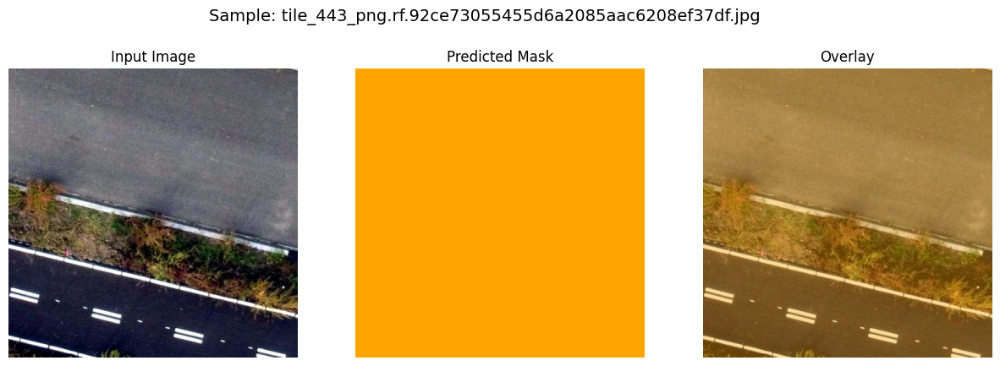

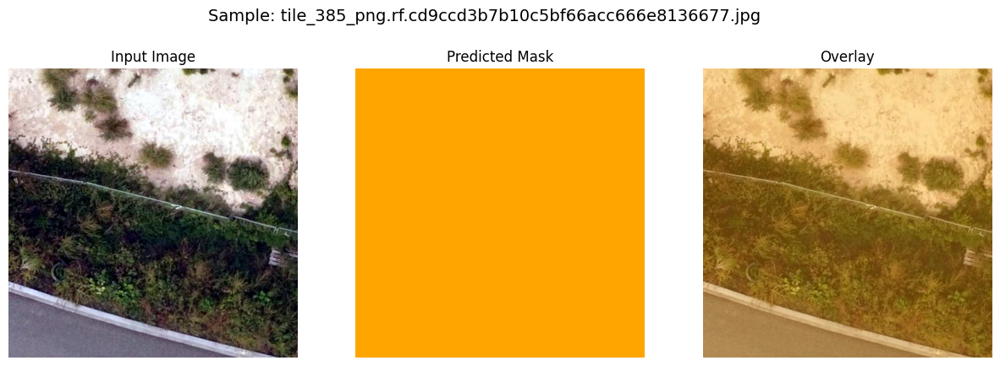

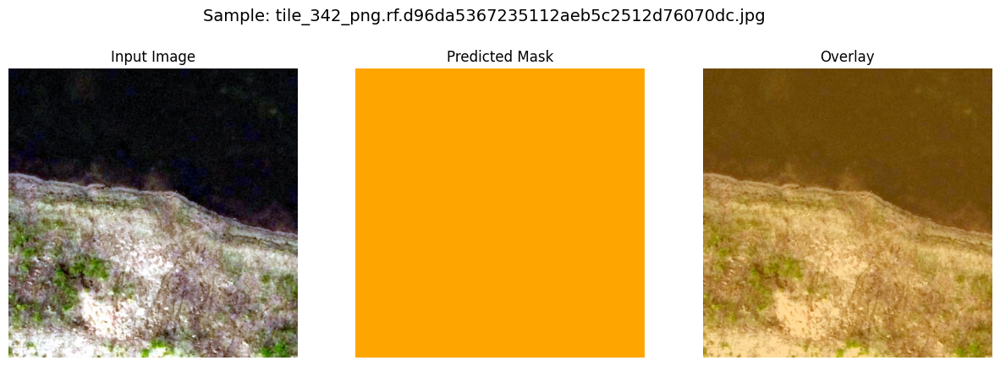

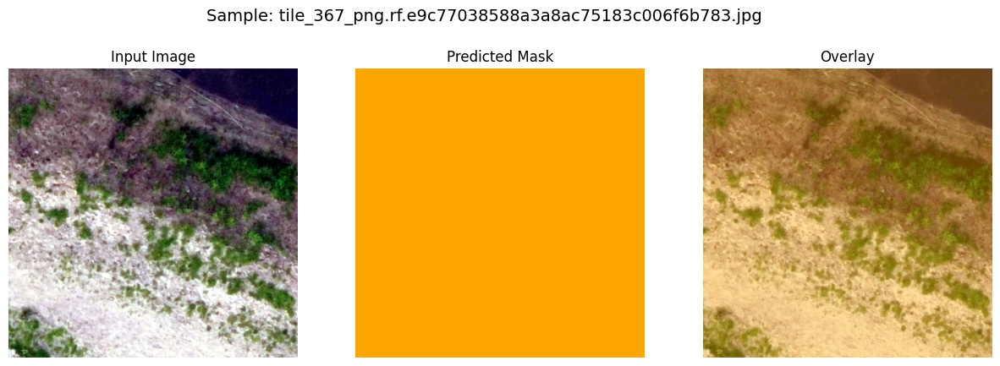

In [ ]:
import os, torch, cv2, numpy as np, matplotlib.pyplot as plt
from torchvision import models
from tqdm import tqdm

# --- Paths ---
BASE_PATH = "/content/drive/MyDrive/terrain_v3"
MODEL_PATH = os.path.join(BASE_PATH, "deeplabv3_terrain_v3.pth")
VAL_IMG_DIR = os.path.join(BASE_PATH, "valid/images")
VAL_MASK_DIR = os.path.join(BASE_PATH, "valid/masks")

NUM_CLASSES = 11
CLASS_NAMES = [
    "background", "Flat Sand", "Grassland", "Obstacle", "Parking lot",
    "Pavement", "Railway Track", "Road", "Sand Heaps", "Trees", "Unknown"
]

# --- Load Model ---
device = "cuda" if torch.cuda.is_available() else "cpu"
model = models.segmentation.deeplabv3_resnet50(weights=None, aux_loss=None)
model.classifier[4] = torch.nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.to(device).eval()
print(f"✅ Model loaded on {device}")

# --- Evaluation ---
img_files = sorted([f for f in os.listdir(VAL_IMG_DIR) if f.endswith(('.jpg', '.png'))])
mask_files = sorted([f for f in os.listdir(VAL_MASK_DIR) if f.endswith(('.png'))])

def compute_metrics(pred, true_mask, num_classes=NUM_CLASSES):
    pred = pred.flatten()
    true_mask = true_mask.flatten()
    ious = []
    for i in range(num_classes):
        intersection = np.logical_and(pred == i, true_mask == i).sum()
        union = np.logical_or(pred == i, true_mask == i).sum()
        if union == 0:
            ious.append(np.nan)
        else:
            ious.append(intersection / union)
    mean_iou = np.nanmean(ious)
    acc = (pred == true_mask).mean()
    return acc, mean_iou

# --- Evaluate on subset ---
accuracies, mious = [], []
for idx in tqdm(range(min(50, len(img_files)))):
    img_path = os.path.join(VAL_IMG_DIR, img_files[idx])
    mask_path = os.path.join(VAL_MASK_DIR, mask_files[idx])

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    img_tensor = torch.tensor(img.transpose(2, 0, 1)).unsqueeze(0).float() / 255.0
    img_tensor = img_tensor.to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        pred = torch.argmax(out.squeeze(), dim=0).cpu().numpy().astype(np.uint8)

    acc, miou = compute_metrics(pred, mask)
    accuracies.append(acc)
    mious.append(miou)

print(f"📊 Mean Pixel Accuracy: {np.mean(accuracies):.4f}")
print(f"📈 Mean IoU: {np.mean(mious):.4f}")

# --- Visualization ---
import random
sample_ids = random.sample(range(len(img_files)), 4)

def decode_mask(mask):
    # simple color map
    cmap = np.array([
        [0, 0, 0], [194, 178, 128], [0, 255, 0], [255, 0, 0],
        [255, 255, 0], [128, 128, 128], [128, 0, 128], [128, 64, 128],
        [210, 180, 140], [0, 128, 0], [255, 165, 0]
    ], dtype=np.uint8)
    mask_rgb = np.zeros((*mask.shape, 3), dtype=np.uint8)
    for i in range(NUM_CLASSES):
        mask_rgb[mask == i] = cmap[i]
    return mask_rgb

for idx in sample_ids:
    img_path = os.path.join(VAL_IMG_DIR, img_files[idx])
    mask_path = os.path.join(VAL_MASK_DIR, mask_files[idx])

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    img_tensor = torch.tensor(img.transpose(2, 0, 1)).unsqueeze(0).float() / 255.0
    img_tensor = img_tensor.to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        pred = torch.argmax(out.squeeze(), dim=0).cpu().numpy().astype(np.uint8)

    mask_rgb = decode_mask(mask)
    pred_rgb = decode_mask(pred)
    overlay = cv2.addWeighted(img, 0.6, pred_rgb, 0.4, 0)

    plt.figure(figsize=(15, 5))
    plt.suptitle(f"Sample: {img_files[idx]}", fontsize=14)
    plt.subplot(1, 3, 1); plt.imshow(img); plt.title("Input Image"); plt.axis("off")
    plt.subplot(1, 3, 2); plt.imshow(pred_rgb); plt.title("Predicted Mask"); plt.axis("off")
    plt.subplot(1, 3, 3); plt.imshow(overlay); plt.title("Overlay"); plt.axis("off")
    plt.show()


Improve inference

In [ ]:
import os, torch, cv2, numpy as np, matplotlib.pyplot as plt
from torchvision import models

# --- Reload model ---
BASE_PATH = "/content/drive/MyDrive/terrain_v3"
MODEL_PATH = os.path.join(BASE_PATH, "deeplabv3_terrain_v3.pth")
VAL_IMG_DIR = os.path.join(BASE_PATH, "valid/images")
VAL_MASK_DIR = os.path.join(BASE_PATH, "valid/masks")
SAVE_DIR = os.path.join(BASE_PATH, "results")
os.makedirs(SAVE_DIR, exist_ok=True)

NUM_CLASSES = 11
CLASS_NAMES = [
    "background", "Flat Sand", "Grassland", "Obstacle", "Parking lot",
    "Pavement", "Railway Track", "Road", "Sand Heaps", "Trees", "Unknown"
]

device = "cuda" if torch.cuda.is_available() else "cpu"
model = models.segmentation.deeplabv3_resnet50(weights=None, aux_loss=None)
model.classifier[4] = torch.nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.to(device).eval()

print(f"✅ Model loaded on {device}")

# --- Helper: Decode masks to RGB ---
def decode_mask(mask):
    cmap = np.array([
        [0, 0, 0], [194, 178, 128], [0, 255, 0], [255, 0, 0],
        [255, 255, 0], [128, 128, 128], [128, 0, 128], [128, 64, 128],
        [210, 180, 140], [0, 128, 0], [255, 165, 0]
    ], dtype=np.uint8)
    rgb = np.zeros((*mask.shape, 3), dtype=np.uint8)
    for i in range(NUM_CLASSES):
        rgb[mask == i] = cmap[i]
    return rgb

# --- Inference loop with improved normalization ---
from tqdm import tqdm

img_files = sorted([f for f in os.listdir(VAL_IMG_DIR) if f.endswith(('.jpg', '.png'))])

for img_name in tqdm(img_files[:12]):  # visualize first 12
    img_path = os.path.join(VAL_IMG_DIR, img_name)
    mask_path = os.path.join(VAL_MASK_DIR, img_name.replace(".jpg", "_mask.png"))

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    # --- Normalize correctly ---
    img_tensor = torch.from_numpy(img.transpose(2, 0, 1)).float() / 255.0
    img_tensor = img_tensor.unsqueeze(0).to(device)

    with torch.no_grad():
        out = model(img_tensor)["out"]
        pred = torch.argmax(out.squeeze(), dim=0).cpu().numpy().astype(np.uint8)

    # --- Decode & Overlay ---
    pred_rgb = decode_mask(pred)
    mask_rgb = decode_mask(mask)
    overlay = cv2.addWeighted(img, 0.6, pred_rgb, 0.4, 0)

    # --- Visualization ---
    fig, ax = plt.subplots(1, 3, figsize=(14, 5))
    fig.suptitle(f"Sample: {img_name}", fontsize=13)
    ax[0].imshow(img); ax[0].set_title("Input Image"); ax[0].axis("off")
    ax[1].imshow(pred_rgb); ax[1].set_title("Predicted Mask"); ax[1].axis("off")
    ax[2].imshow(overlay); ax[2].set_title("Overlay"); ax[2].axis("off")

    save_path = os.path.join(SAVE_DIR, img_name.replace(".jpg", "_viz.png"))
    plt.savefig(save_path, bbox_inches="tight")
    plt.close(fig)

print(f"📁 Visualizations saved to: {SAVE_DIR}")


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 207MB/s]


✅ Model loaded on cuda


100%|██████████| 12/12 [00:25<00:00,  2.09s/it]

📁 Visualizations saved to: /content/drive/MyDrive/terrain_v3/results


In [ ]:
all_preds = []
for img_name in img_files[:100]:
    img_path = os.path.join(VAL_IMG_DIR, img_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_tensor = torch.from_numpy(img.transpose(2, 0, 1)).float().unsqueeze(0).to(device) / 255.0
    with torch.no_grad():
        out = model(img_tensor)["out"]
        pred = torch.argmax(out.squeeze(), dim=0).cpu().numpy()
        all_preds.append(pred)

flat = np.concatenate([p.flatten() for p in all_preds])
unique, counts = np.unique(flat, return_counts=True)
dist = dict(zip(unique, counts))
print("📊 Predicted class distribution:")
for cls_id, cnt in dist.items():
    print(f"  {cls_id:2d} → {CLASS_NAMES[cls_id]:<15} ({cnt} pixels)")


📊 Predicted class distribution:
  10 → Unknown         (40960000 pixels)


In [ ]:
# =============================================================
# 1️⃣ Compute class weights from masks
# =============================================================
import glob, numpy as np, cv2, torch
from tqdm import tqdm

mask_paths = glob.glob("/content/drive/MyDrive/terrain_v3/train/masks/*.png")
pixel_counts = np.zeros(11, dtype=np.int64)

for mpath in tqdm(mask_paths, desc="Counting pixels"):
    mask = cv2.imread(mpath, cv2.IMREAD_GRAYSCALE)
    vals, cnts = np.unique(mask, return_counts=True)
    for v, c in zip(vals, cnts):
        if v < len(pixel_counts):
            pixel_counts[v] += c

freq = pixel_counts / pixel_counts.sum()
class_weights = 1.0 / (freq + 1e-6)
class_weights = class_weights / class_weights.sum() * len(class_weights)
print("📊 Class weights:", np.round(class_weights,2))

torch.save(torch.tensor(class_weights, dtype=torch.float32), "class_weights.pt")


Counting pixels: 100%|██████████| 368/368 [00:09<00:00, 38.93it/s]

📊 Class weights: [0.78 0.98 0.16 1.19 1.5  2.04 0.99 0.52 0.72 0.19 1.92]


In [ ]:
# =============================================================
# 2️⃣ Rebuild model + training with weighting & normalization
# =============================================================
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torchvision import models
from torch import nn, optim
from torch.utils.data import DataLoader
import wandb, os

# --- Transforms ---
def get_transforms():
    train_tf = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(0.2, 0.2),
        A.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)),
        ToTensorV2()
    ])
    val_tf = A.Compose([
        A.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)),
        ToTensorV2()
    ])
    return train_tf, val_tf

# --- Load weights & setup ---
weights = torch.load("class_weights.pt")
device = "cuda" if torch.cuda.is_available() else "cpu"

model = models.segmentation.deeplabv3_resnet50(weights=None, aux_loss=None)
model.classifier[4] = nn.Conv2d(256, 11, kernel_size=1)
model.to(device)

criterion = nn.CrossEntropyLoss(weight=weights.to(device))
optimizer = optim.Adam(model.parameters(), lr=1e-4)
train_tf, val_tf = get_transforms()

# --- Datasets ---
train_dir = "/content/drive/MyDrive/terrain_v3/train/images"
val_dir   = "/content/drive/MyDrive/terrain_v3/valid/images"
train_mask_dir = "/content/drive/MyDrive/terrain_v3/train/masks"
val_mask_dir   = "/content/drive/MyDrive/terrain_v3/valid/masks"

train_ds = SegmentationDataset(train_dir, train_mask_dir, train_tf)
val_ds   = SegmentationDataset(val_dir, val_mask_dir, val_tf)
train_loader = DataLoader(train_ds, batch_size=4, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_ds, batch_size=2, shuffle=False)

# --- W&B ---
wandb.init(project="UAV_LandingZone_Segmentation", name="DeepLabv3_Terrain_v3_Weighted")
wandb.config.update({"epochs":60, "lr":1e-4, "batch_size":4})

# --- Training ---
EPOCHS = 60
for epoch in range(EPOCHS):
    model.train(); train_loss = 0
    for imgs, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS}"):
        imgs, masks = imgs.to(device).float(), masks.to(device).long()
        out = model(imgs)["out"]
        loss = criterion(out, masks)
        optimizer.zero_grad(); loss.backward(); optimizer.step()
        train_loss += loss.item()

    wandb.log({"Train Loss": train_loss / len(train_loader)})
    print(f"Epoch [{epoch+1}/{EPOCHS}] Loss={train_loss/len(train_loader):.4f}")

torch.save(model.state_dict(), os.path.join("/content/drive/MyDrive/terrain_v3", "deeplabv3_weighted.pth"))
wandb.finish()
print("✅ Retraining done with class weighting")


Epoch 1/60: 100%|██████████| 92/92 [00:16<00:00,  5.68it/s]


Epoch [1/60] Loss=1.7694


Epoch 2/60: 100%|██████████| 92/92 [00:15<00:00,  6.10it/s]


Epoch [2/60] Loss=1.3713


Epoch 3/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [3/60] Loss=1.2011


Epoch 4/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [4/60] Loss=1.1358


Epoch 5/60: 100%|██████████| 92/92 [00:15<00:00,  6.13it/s]


Epoch [5/60] Loss=0.9369


Epoch 6/60: 100%|██████████| 92/92 [00:15<00:00,  6.13it/s]


Epoch [6/60] Loss=0.8676


Epoch 7/60: 100%|██████████| 92/92 [00:15<00:00,  6.10it/s]


Epoch [7/60] Loss=0.7973


Epoch 8/60: 100%|██████████| 92/92 [00:15<00:00,  6.09it/s]


Epoch [8/60] Loss=0.7311


Epoch 9/60: 100%|██████████| 92/92 [00:15<00:00,  5.87it/s]


Epoch [9/60] Loss=0.7248


Epoch 10/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [10/60] Loss=0.6498


Epoch 11/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [11/60] Loss=0.6464


Epoch 12/60: 100%|██████████| 92/92 [00:15<00:00,  6.10it/s]


Epoch [12/60] Loss=0.5661


Epoch 13/60: 100%|██████████| 92/92 [00:15<00:00,  6.09it/s]


Epoch [13/60] Loss=0.5817


Epoch 14/60: 100%|██████████| 92/92 [00:15<00:00,  6.09it/s]


Epoch [14/60] Loss=0.4855


Epoch 15/60: 100%|██████████| 92/92 [00:15<00:00,  6.08it/s]


Epoch [15/60] Loss=0.5354


Epoch 16/60: 100%|██████████| 92/92 [00:15<00:00,  6.01it/s]


Epoch [16/60] Loss=0.5451


Epoch 17/60: 100%|██████████| 92/92 [00:15<00:00,  6.10it/s]


Epoch [17/60] Loss=0.4768


Epoch 18/60: 100%|██████████| 92/92 [00:15<00:00,  6.08it/s]


Epoch [18/60] Loss=0.4439


Epoch 19/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [19/60] Loss=0.4065


Epoch 20/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [20/60] Loss=0.4295


Epoch 21/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [21/60] Loss=0.4505


Epoch 22/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [22/60] Loss=0.4113


Epoch 23/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [23/60] Loss=0.4018


Epoch 24/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [24/60] Loss=0.3441


Epoch 25/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [25/60] Loss=0.3767


Epoch 26/60: 100%|██████████| 92/92 [00:15<00:00,  6.13it/s]


Epoch [26/60] Loss=0.3258


Epoch 27/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [27/60] Loss=0.2791


Epoch 28/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [28/60] Loss=0.2798


Epoch 29/60: 100%|██████████| 92/92 [00:15<00:00,  6.10it/s]


Epoch [29/60] Loss=0.2909


Epoch 30/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [30/60] Loss=0.2938


Epoch 31/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [31/60] Loss=0.3860


Epoch 32/60: 100%|██████████| 92/92 [00:15<00:00,  6.07it/s]


Epoch [32/60] Loss=0.2930


Epoch 33/60: 100%|██████████| 92/92 [00:15<00:00,  6.10it/s]


Epoch [33/60] Loss=0.2698


Epoch 34/60: 100%|██████████| 92/92 [00:15<00:00,  6.10it/s]


Epoch [34/60] Loss=0.2438


Epoch 35/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [35/60] Loss=0.2574


Epoch 36/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [36/60] Loss=0.2698


Epoch 37/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [37/60] Loss=0.2502


Epoch 38/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [38/60] Loss=0.2504


Epoch 39/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [39/60] Loss=0.2593


Epoch 40/60: 100%|██████████| 92/92 [00:15<00:00,  6.08it/s]


Epoch [40/60] Loss=0.2310


Epoch 41/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [41/60] Loss=0.2125


Epoch 42/60: 100%|██████████| 92/92 [00:15<00:00,  6.10it/s]


Epoch [42/60] Loss=0.1913


Epoch 43/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [43/60] Loss=0.1603


Epoch 44/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [44/60] Loss=0.1857


Epoch 45/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [45/60] Loss=0.2003


Epoch 46/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [46/60] Loss=0.4357


Epoch 47/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [47/60] Loss=0.3381


Epoch 48/60: 100%|██████████| 92/92 [00:15<00:00,  6.04it/s]


Epoch [48/60] Loss=0.3184


Epoch 49/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [49/60] Loss=0.2517


Epoch 50/60: 100%|██████████| 92/92 [00:14<00:00,  6.14it/s]


Epoch [50/60] Loss=0.2930


Epoch 51/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [51/60] Loss=0.2798


Epoch 52/60: 100%|██████████| 92/92 [00:15<00:00,  6.13it/s]


Epoch [52/60] Loss=0.2845


Epoch 53/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [53/60] Loss=0.1954


Epoch 54/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [54/60] Loss=0.1699


Epoch 55/60: 100%|██████████| 92/92 [00:15<00:00,  6.10it/s]


Epoch [55/60] Loss=0.1880


Epoch 56/60: 100%|██████████| 92/92 [00:15<00:00,  6.10it/s]


Epoch [56/60] Loss=0.1550


Epoch 57/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [57/60] Loss=0.1411


Epoch 58/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [58/60] Loss=0.1542


Epoch 59/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [59/60] Loss=0.1953


Epoch 60/60: 100%|██████████| 92/92 [00:15<00:00,  6.10it/s]


Epoch [60/60] Loss=0.1609


Train Loss,█▆▅▄▄▄▃▃▂▃▂▂▂▂▂▂▂▂▂▂▂▁▁▂▁▂▁▁▁▁▂▂▁▂▂▁▁▁▁▁
Train Loss,0.16094


✅ Retraining done with class weighting


In [ ]:
# =============================================================
# 🚀 Retraining DeepLabv3 with Class Weights and Normalization
# =============================================================
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torchvision import models
from torch import nn, optim
from torch.utils.data import DataLoader
import torch, os, wandb
from tqdm import tqdm

# --- Transforms ---
def get_transforms():
    train_tf = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(0.2, 0.2),
        A.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)),
        ToTensorV2()
    ])
    val_tf = A.Compose([
        A.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)),
        ToTensorV2()
    ])
    return train_tf, val_tf

# --- Load class weights ---
weights = torch.load("class_weights.pt")

# --- Model Setup ---
device = "cuda" if torch.cuda.is_available() else "cpu"
model = models.segmentation.deeplabv3_resnet50(weights=None, aux_loss=None)
model.classifier[4] = nn.Conv2d(256, 11, kernel_size=1)
model.to(device)

criterion = nn.CrossEntropyLoss(weight=weights.to(device))
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# --- Datasets and Loaders ---
train_tf, val_tf = get_transforms()

train_ds = SegmentationDataset(
    "/content/drive/MyDrive/terrain_v3/train/images",
    "/content/drive/MyDrive/terrain_v3/train/masks",
    train_tf
)
val_ds = SegmentationDataset(
    "/content/drive/MyDrive/terrain_v3/valid/images",
    "/content/drive/MyDrive/terrain_v3/valid/masks",
    val_tf
)

train_loader = DataLoader(train_ds, batch_size=4, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_ds, batch_size=2, shuffle=False)

# --- Weights & Biases ---
wandb.init(project="UAV_LandingZone_Segmentation", name="DeepLabv3_Terrain_v3_Weighted")
wandb.config.update({
    "epochs": 60,
    "batch_size": 4,
    "lr": 1e-4,
    "num_classes": 11
})

# --- Training Loop ---
EPOCHS = 60
for epoch in range(EPOCHS):
    model.train(); train_loss = 0
    for imgs, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS}"):
        imgs, masks = imgs.to(device).float(), masks.to(device).long()
        out = model(imgs)["out"]
        loss = criterion(out, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss += loss.item()

    avg_loss = train_loss / len(train_loader)
    wandb.log({"Train Loss": avg_loss})
    print(f"Epoch [{epoch+1}/{EPOCHS}] - Train Loss: {avg_loss:.4f}")

torch.save(model.state_dict(), "/content/drive/MyDrive/terrain_v3/deeplabv3_weighted.pth")
wandb.finish()
print("✅ Retraining done with class weighting!")


Epoch 1/60: 100%|██████████| 92/92 [00:15<00:00,  5.90it/s]


Epoch [1/60] - Train Loss: 1.7689


Epoch 2/60: 100%|██████████| 92/92 [00:14<00:00,  6.16it/s]


Epoch [2/60] - Train Loss: 1.3762


Epoch 3/60: 100%|██████████| 92/92 [00:15<00:00,  6.13it/s]


Epoch [3/60] - Train Loss: 1.1714


Epoch 4/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [4/60] - Train Loss: 1.0356


Epoch 5/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [5/60] - Train Loss: 1.0180


Epoch 6/60: 100%|██████████| 92/92 [00:15<00:00,  6.13it/s]


Epoch [6/60] - Train Loss: 0.8588


Epoch 7/60: 100%|██████████| 92/92 [00:15<00:00,  6.13it/s]


Epoch [7/60] - Train Loss: 0.8098


Epoch 8/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [8/60] - Train Loss: 0.7419


Epoch 9/60: 100%|██████████| 92/92 [00:15<00:00,  5.89it/s]


Epoch [9/60] - Train Loss: 0.7454


Epoch 10/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [10/60] - Train Loss: 0.7233


Epoch 11/60: 100%|██████████| 92/92 [00:14<00:00,  6.13it/s]


Epoch [11/60] - Train Loss: 0.6340


Epoch 12/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [12/60] - Train Loss: 0.5610


Epoch 13/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [13/60] - Train Loss: 0.5374


Epoch 14/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [14/60] - Train Loss: 0.5784


Epoch 15/60: 100%|██████████| 92/92 [00:15<00:00,  6.10it/s]


Epoch [15/60] - Train Loss: 0.5457


Epoch 16/60: 100%|██████████| 92/92 [00:15<00:00,  6.13it/s]


Epoch [16/60] - Train Loss: 0.5749


Epoch 17/60: 100%|██████████| 92/92 [00:15<00:00,  6.10it/s]


Epoch [17/60] - Train Loss: 0.4848


Epoch 18/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [18/60] - Train Loss: 0.4261


Epoch 19/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [19/60] - Train Loss: 0.4278


Epoch 20/60: 100%|██████████| 92/92 [00:14<00:00,  6.13it/s]


Epoch [20/60] - Train Loss: 0.3885


Epoch 21/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [21/60] - Train Loss: 0.3629


Epoch 22/60: 100%|██████████| 92/92 [00:15<00:00,  6.13it/s]


Epoch [22/60] - Train Loss: 0.3775


Epoch 23/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [23/60] - Train Loss: 0.3472


Epoch 24/60: 100%|██████████| 92/92 [00:15<00:00,  6.07it/s]


Epoch [24/60] - Train Loss: 0.3438


Epoch 25/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [25/60] - Train Loss: 0.3457


Epoch 26/60: 100%|██████████| 92/92 [00:15<00:00,  6.13it/s]


Epoch [26/60] - Train Loss: 0.3027


Epoch 27/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [27/60] - Train Loss: 0.2987


Epoch 28/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [28/60] - Train Loss: 0.2818


Epoch 29/60: 100%|██████████| 92/92 [00:14<00:00,  6.14it/s]


Epoch [29/60] - Train Loss: 0.2418


Epoch 30/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [30/60] - Train Loss: 0.3090


Epoch 31/60: 100%|██████████| 92/92 [00:15<00:00,  6.13it/s]


Epoch [31/60] - Train Loss: 0.3091


Epoch 32/60: 100%|██████████| 92/92 [00:15<00:00,  6.10it/s]


Epoch [32/60] - Train Loss: 0.4187


Epoch 33/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [33/60] - Train Loss: 0.5646


Epoch 34/60: 100%|██████████| 92/92 [00:15<00:00,  6.13it/s]


Epoch [34/60] - Train Loss: 0.4876


Epoch 35/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [35/60] - Train Loss: 0.4193


Epoch 36/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [36/60] - Train Loss: 0.3074


Epoch 37/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [37/60] - Train Loss: 0.2643


Epoch 38/60: 100%|██████████| 92/92 [00:15<00:00,  6.13it/s]


Epoch [38/60] - Train Loss: 0.2224


Epoch 39/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [39/60] - Train Loss: 0.2358


Epoch 40/60: 100%|██████████| 92/92 [00:15<00:00,  6.04it/s]


Epoch [40/60] - Train Loss: 0.2283


Epoch 41/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [41/60] - Train Loss: 0.2141


Epoch 42/60: 100%|██████████| 92/92 [00:15<00:00,  6.13it/s]


Epoch [42/60] - Train Loss: 0.2023


Epoch 43/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [43/60] - Train Loss: 0.1797


Epoch 44/60: 100%|██████████| 92/92 [00:15<00:00,  6.10it/s]


Epoch [44/60] - Train Loss: 0.1817


Epoch 45/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [45/60] - Train Loss: 0.1845


Epoch 46/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [46/60] - Train Loss: 0.2308


Epoch 47/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [47/60] - Train Loss: 0.2276


Epoch 48/60: 100%|██████████| 92/92 [00:15<00:00,  6.05it/s]


Epoch [48/60] - Train Loss: 0.1986


Epoch 49/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [49/60] - Train Loss: 0.1814


Epoch 50/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [50/60] - Train Loss: 0.1927


Epoch 51/60: 100%|██████████| 92/92 [00:15<00:00,  6.09it/s]


Epoch [51/60] - Train Loss: 0.1757


Epoch 52/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [52/60] - Train Loss: 0.1662


Epoch 53/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [53/60] - Train Loss: 0.1893


Epoch 54/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [54/60] - Train Loss: 0.1849


Epoch 55/60: 100%|██████████| 92/92 [00:15<00:00,  6.13it/s]


Epoch [55/60] - Train Loss: 0.1966


Epoch 56/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [56/60] - Train Loss: 0.2953


Epoch 57/60: 100%|██████████| 92/92 [00:15<00:00,  6.10it/s]


Epoch [57/60] - Train Loss: 0.3336


Epoch 58/60: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]


Epoch [58/60] - Train Loss: 0.2671


Epoch 59/60: 100%|██████████| 92/92 [00:15<00:00,  6.13it/s]


Epoch [59/60] - Train Loss: 0.1916


Epoch 60/60: 100%|██████████| 92/92 [00:15<00:00,  6.11it/s]


Epoch [60/60] - Train Loss: 0.1675


Train Loss,█▆▅▅▄▃▄▃▃▃▃▃▂▂▂▂▂▂▂▂▁▂▂▂▃▂▁▁▁▁▁▁▁▁▁▁▁▂▂▁
Train Loss,0.16745


✅ Retraining done with class weighting!


Evaluating: 100%|██████████| 105/105 [00:07<00:00, 13.75it/s]



✅ Pixel Accuracy: 0.7624
✅ Mean IoU (mIoU): 0.6231

 0 | background      → IoU = 0.219
 1 | Flat Sand       → IoU = 0.405
 2 | Grassland       → IoU = 0.605
 3 | Obstacle        → IoU = 0.495
 4 | Parking lot     → IoU = 0.720
 5 | Pavement        → IoU = 0.694
 6 | Railway Track   → IoU = 0.965
 7 | Road            → IoU = 0.806
 8 | Sand Heaps      → IoU = 0.519
 9 | Trees           → IoU = 0.707
10 | Unknown         → IoU = 0.719


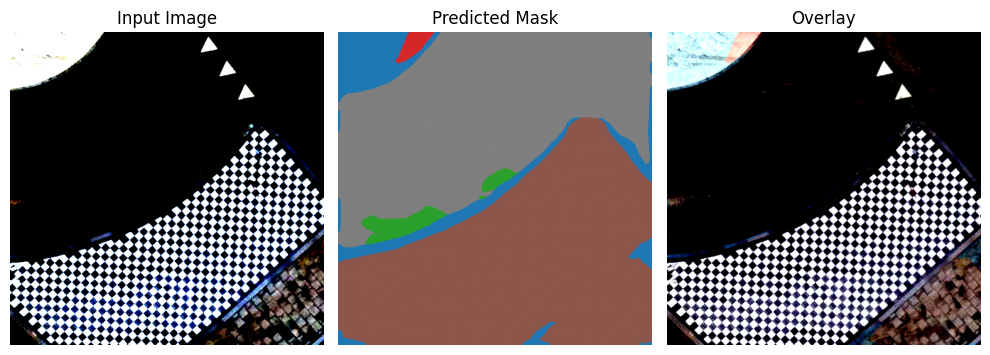

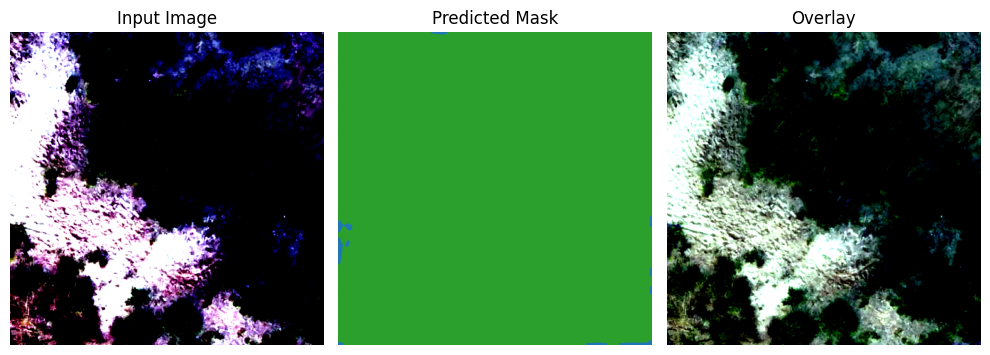

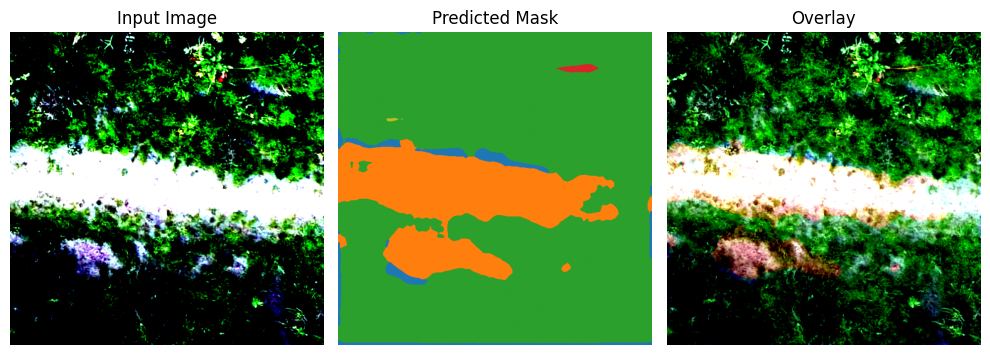

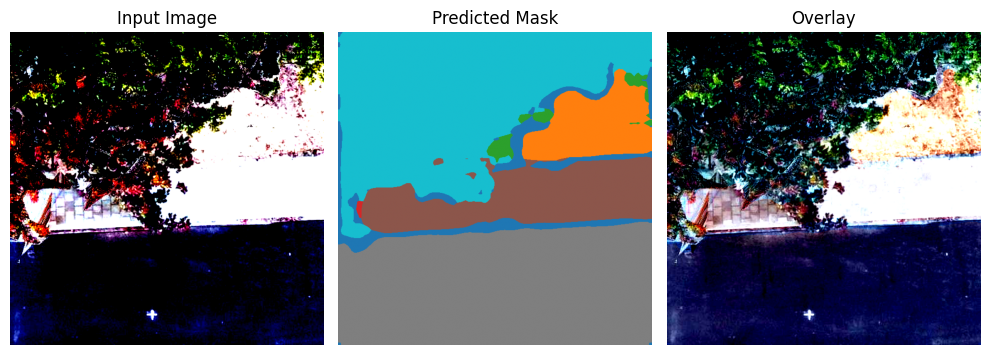

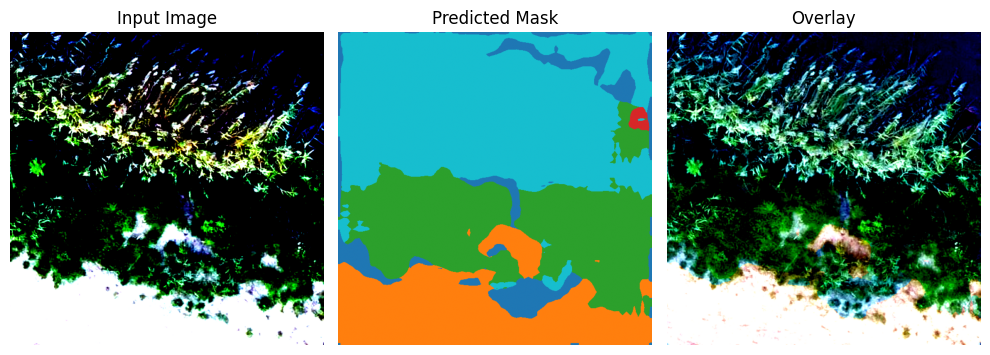

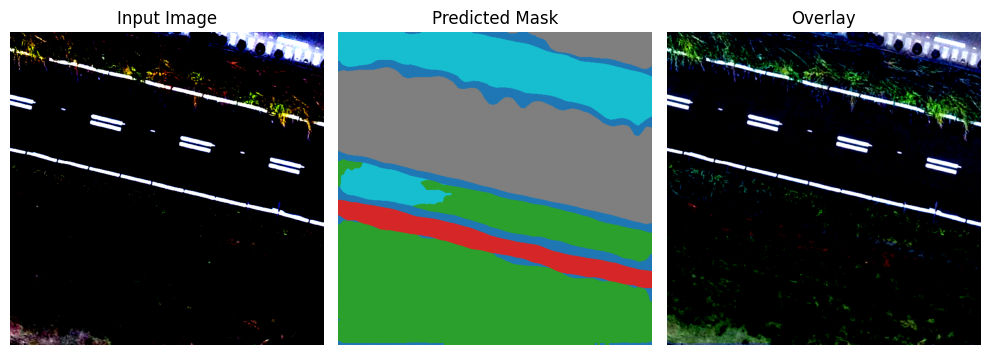

In [ ]:
# =============================================================
# 📊 Evaluation and Visualization for DeepLabv3_Terrain_v3_Weighted
# =============================================================
import torch, cv2, os, numpy as np, matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.metrics import confusion_matrix

device = "cuda" if torch.cuda.is_available() else "cpu"

# --- Load model ---
model = models.segmentation.deeplabv3_resnet50(weights=None, aux_loss=None)
model.classifier[4] = nn.Conv2d(256, 11, kernel_size=1)
model.load_state_dict(torch.load("/content/drive/MyDrive/terrain_v3/deeplabv3_weighted.pth", map_location=device))
model.to(device).eval()

# --- Validation set ---
val_img_dir  = "/content/drive/MyDrive/terrain_v3/valid/images"
val_mask_dir = "/content/drive/MyDrive/terrain_v3/valid/masks"
val_tf = A.Compose([
    A.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)),
    ToTensorV2()
])
val_ds = SegmentationDataset(val_img_dir, val_mask_dir, val_tf)
val_loader = DataLoader(val_ds, batch_size=1, shuffle=False)

# --- Class info ---
CLASS_NAMES = [
    "background","Flat Sand","Grassland","Obstacle",
    "Parking lot","Pavement","Railway Track","Road",
    "Sand Heaps","Trees","Unknown"
]
NUM_CLASSES = len(CLASS_NAMES)

# =============================================================
# 🧮 Metric computation
# =============================================================
def compute_metrics(y_true, y_pred, num_classes):
    cm = confusion_matrix(y_true.flatten(), y_pred.flatten(), labels=list(range(num_classes)))
    intersection = np.diag(cm)
    union = cm.sum(axis=1) + cm.sum(axis=0) - intersection
    iou = intersection / np.maximum(union, 1)
    miou = np.nanmean(iou)
    pixel_acc = np.sum(intersection) / np.maximum(cm.sum(), 1)
    return pixel_acc, miou, iou

# --- Collect predictions ---
all_true, all_pred = [], []
for imgs, masks in tqdm(val_loader, desc="Evaluating"):
    imgs, masks = imgs.to(device).float(), masks.to(device).long()
    with torch.no_grad():
        out = model(imgs)["out"]
    preds = torch.argmax(out, dim=1).cpu().numpy()
    all_true.append(masks.cpu().numpy())
    all_pred.append(preds)

y_true = np.concatenate(all_true).astype(np.uint8)
y_pred = np.concatenate(all_pred).astype(np.uint8)

pixel_acc, miou, iou_per_class = compute_metrics(y_true, y_pred, NUM_CLASSES)

print(f"\n✅ Pixel Accuracy: {pixel_acc:.4f}")
print(f"✅ Mean IoU (mIoU): {miou:.4f}\n")
for i, name in enumerate(CLASS_NAMES):
    print(f"{i:2d} | {name:15s} → IoU = {iou_per_class[i]:.3f}")

# =============================================================
# 🎨 Visualization
# =============================================================
def visualize_predictions(model, dataset, num_samples=5):
    model.eval()
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    cmap = plt.get_cmap("tab10", NUM_CLASSES)

    for idx in indices:
        img, mask = dataset[idx]
        img_np = img.permute(1,2,0).cpu().numpy()
        mask_np = mask.cpu().numpy()
        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device).float())["out"]
            pred = torch.argmax(pred, dim=1).squeeze().cpu().numpy()

        overlay = (0.5*img_np + 0.5*cmap(pred)[:,:,:3]).clip(0,1)
        plt.figure(figsize=(10,4))
        plt.subplot(1,3,1)
        plt.imshow(img_np); plt.title("Input Image"); plt.axis("off")
        plt.subplot(1,3,2)
        plt.imshow(pred, cmap=cmap, vmin=0, vmax=NUM_CLASSES-1)
        plt.title("Predicted Mask"); plt.axis("off")
        plt.subplot(1,3,3)
        plt.imshow(overlay); plt.title("Overlay"); plt.axis("off")
        plt.tight_layout()
        plt.show()

visualize_predictions(model, val_ds, num_samples=6)


In [ ]:
# =============================================================
# 🔧 Fine-tuning DeepLabv3_Terrain_v3_Weighted
# =============================================================
import torch
from torch import nn, optim
from torchvision import models
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import DataLoader
from tqdm import tqdm
import wandb, os

# --- Transforms ---
def get_finetune_transforms():
    train_tf = A.Compose([
        A.Resize(512,512),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.3),
        A.RandomRotate90(p=0.3),
        A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.3),
        A.RandomBrightnessContrast(0.3,0.3),
        A.GaussianBlur(p=0.2),
        A.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)),
        ToTensorV2()
    ])
    val_tf = A.Compose([
        A.Resize(512,512),
        A.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)),
        ToTensorV2()
    ])
    return train_tf, val_tf

# --- Load model checkpoint ---
device = "cuda" if torch.cuda.is_available() else "cpu"
model = models.segmentation.deeplabv3_resnet50(weights=None, aux_loss=None)
model.classifier[4] = nn.Conv2d(256, 11, kernel_size=1)
model.load_state_dict(torch.load("/content/drive/MyDrive/terrain_v3/deeplabv3_weighted.pth", map_location=device))

# Freeze early ResNet layers
for name, param in model.backbone.named_parameters():
    if "layer4" not in name:  # only last ResNet block remains trainable
        param.requires_grad = False

model.to(device)
weights = torch.load("class_weights.pt").to(device)
criterion = nn.CrossEntropyLoss(weight=weights)

# --- Optimizer (lower LR for fine-tuning) ---
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-5)

# --- Data ---
train_tf, val_tf = get_finetune_transforms()
train_ds = SegmentationDataset("/content/drive/MyDrive/terrain_v3/train/images",
                               "/content/drive/MyDrive/terrain_v3/train/masks", train_tf)
val_ds = SegmentationDataset("/content/drive/MyDrive/terrain_v3/valid/images",
                             "/content/drive/MyDrive/terrain_v3/valid/masks", val_tf)
train_loader = DataLoader(train_ds, batch_size=4, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_ds, batch_size=2, shuffle=False)

# --- W&B setup ---
wandb.init(project="UAV_LandingZone_Segmentation", name="DeepLabv3_Terrain_v3_Finetune")
wandb.config.update({"lr":1e-5,"epochs":40,"batch_size":4,"freeze":"backbone<layer4"})

# =============================================================
# 🚀 Fine-tuning loop
# =============================================================
EPOCHS = 40
best_val_loss = float("inf")

for epoch in range(EPOCHS):
    model.train(); train_loss = 0
    for imgs, masks in tqdm(train_loader, desc=f"[Epoch {epoch+1}/{EPOCHS}] Training"):
        imgs, masks = imgs.to(device).float(), masks.to(device).long()
        out = model(imgs)["out"]
        loss = criterion(out, masks)
        optimizer.zero_grad(); loss.backward(); optimizer.step()
        train_loss += loss.item()

    # Validation phase
    model.eval(); val_loss = 0
    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs, masks = imgs.to(device).float(), masks.to(device).long()
            out = model(imgs)["out"]
            loss = criterion(out, masks)
            val_loss += loss.item()
    val_loss /= len(val_loader)

    wandb.log({"Train Loss": train_loss/len(train_loader), "Val Loss": val_loss})
    print(f"Epoch {epoch+1}/{EPOCHS} - Train: {train_loss/len(train_loader):.4f} | Val: {val_loss:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), "/content/drive/MyDrive/terrain_v3/deeplabv3_finetuned.pth")
        print(f"✅ Saved new best model (val_loss={val_loss:.4f})")

wandb.finish()
print("🏁 Fine-tuning complete.")


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


[Epoch 1/40] Training: 100%|██████████| 92/92 [00:08<00:00, 10.30it/s]


Epoch 1/40 - Train: 0.5935 | Val: 1.3685
✅ Saved new best model (val_loss=1.3685)


[Epoch 2/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.18it/s]


Epoch 2/40 - Train: 0.5246 | Val: 1.4480


[Epoch 3/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.10it/s]


Epoch 3/40 - Train: 0.4960 | Val: 1.3878


[Epoch 4/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.20it/s]


Epoch 4/40 - Train: 0.4798 | Val: 1.4436


[Epoch 5/40] Training: 100%|██████████| 92/92 [00:07<00:00, 11.70it/s]


Epoch 5/40 - Train: 0.4277 | Val: 1.4896


[Epoch 6/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.14it/s]


Epoch 6/40 - Train: 0.4226 | Val: 1.5340


[Epoch 7/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.15it/s]


Epoch 7/40 - Train: 0.4060 | Val: 1.4627


[Epoch 8/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.10it/s]


Epoch 8/40 - Train: 0.4166 | Val: 1.2037
✅ Saved new best model (val_loss=1.2037)


[Epoch 9/40] Training: 100%|██████████| 92/92 [00:07<00:00, 11.75it/s]


Epoch 9/40 - Train: 0.3884 | Val: 1.3446


[Epoch 10/40] Training: 100%|██████████| 92/92 [00:10<00:00,  8.60it/s]


Epoch 10/40 - Train: 0.3659 | Val: 1.2747


[Epoch 11/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.18it/s]


Epoch 11/40 - Train: 0.3619 | Val: 1.2711


[Epoch 12/40] Training: 100%|██████████| 92/92 [00:07<00:00, 11.53it/s]


Epoch 12/40 - Train: 0.4151 | Val: 1.3888


[Epoch 13/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.13it/s]


Epoch 13/40 - Train: 0.3518 | Val: 1.1998
✅ Saved new best model (val_loss=1.1998)


[Epoch 14/40] Training: 100%|██████████| 92/92 [00:08<00:00, 11.30it/s]


Epoch 14/40 - Train: 0.3718 | Val: 1.4444


[Epoch 15/40] Training: 100%|██████████| 92/92 [00:10<00:00,  8.55it/s]


Epoch 15/40 - Train: 0.4082 | Val: 1.4749


[Epoch 16/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.09it/s]


Epoch 16/40 - Train: 0.3432 | Val: 1.4056


[Epoch 17/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.15it/s]


Epoch 17/40 - Train: 0.3861 | Val: 1.5194


[Epoch 18/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.11it/s]


Epoch 18/40 - Train: 0.3871 | Val: 1.4561


[Epoch 19/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.10it/s]


Epoch 19/40 - Train: 0.3603 | Val: 1.4633


[Epoch 20/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.14it/s]


Epoch 20/40 - Train: 0.3347 | Val: 1.4682


[Epoch 21/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.10it/s]


Epoch 21/40 - Train: 0.3033 | Val: 1.3983


[Epoch 22/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.13it/s]


Epoch 22/40 - Train: 0.3569 | Val: 1.4479


[Epoch 23/40] Training: 100%|██████████| 92/92 [00:08<00:00, 11.45it/s]


Epoch 23/40 - Train: 0.3621 | Val: 1.3932


[Epoch 24/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.06it/s]


Epoch 24/40 - Train: 0.3249 | Val: 1.4812


[Epoch 25/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.14it/s]


Epoch 25/40 - Train: 0.3015 | Val: 1.4164


[Epoch 26/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.07it/s]


Epoch 26/40 - Train: 0.3390 | Val: 1.4026


[Epoch 27/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.12it/s]


Epoch 27/40 - Train: 0.3235 | Val: 1.3469


[Epoch 28/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.15it/s]


Epoch 28/40 - Train: 0.3213 | Val: 1.2421


[Epoch 29/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.12it/s]


Epoch 29/40 - Train: 0.2920 | Val: 1.4037


[Epoch 30/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.12it/s]


Epoch 30/40 - Train: 0.3298 | Val: 1.4290


[Epoch 31/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.09it/s]


Epoch 31/40 - Train: 0.2760 | Val: 1.4211


[Epoch 32/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.11it/s]


Epoch 32/40 - Train: 0.3104 | Val: 1.3488


[Epoch 33/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.04it/s]


Epoch 33/40 - Train: 0.2800 | Val: 1.1911
✅ Saved new best model (val_loss=1.1911)


[Epoch 34/40] Training: 100%|██████████| 92/92 [00:07<00:00, 11.60it/s]


Epoch 34/40 - Train: 0.2862 | Val: 1.3614


[Epoch 35/40] Training: 100%|██████████| 92/92 [00:11<00:00,  8.14it/s]


Epoch 35/40 - Train: 0.2727 | Val: 1.3973


[Epoch 36/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.07it/s]


Epoch 36/40 - Train: 0.3037 | Val: 1.3848


[Epoch 37/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.08it/s]


Epoch 37/40 - Train: 0.2837 | Val: 1.3854


[Epoch 38/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.13it/s]


Epoch 38/40 - Train: 0.2698 | Val: 1.2441


[Epoch 39/40] Training: 100%|██████████| 92/92 [00:07<00:00, 12.15it/s]


Epoch 39/40 - Train: 0.3065 | Val: 1.1829
✅ Saved new best model (val_loss=1.1829)


[Epoch 40/40] Training: 100%|██████████| 92/92 [00:07<00:00, 11.54it/s]


Epoch 40/40 - Train: 0.3042 | Val: 1.3819


Train Loss,█▇▆▆▄▄▄▄▄▃▃▄▃▃▄▃▄▄▃▂▂▃▃▂▂▂▂▂▁▂▁▂▁▁▁▂▁▁▂▂
Val Loss,▅▆▅▆▇█▇▁▄▃▃▅▁▆▇▅█▆▇▇▅▆▅▇▆▅▄▂▅▆▆▄▁▅▅▅▅▂▁▅
Train Loss,0.30416
Val Loss,1.38191


🏁 Fine-tuning complete.


In [ ]:
model.load_state_dict(torch.load("/content/drive/MyDrive/terrain_v3/deeplabv3_finetuned.pth"))


<All keys matched successfully>

✅ Finetuned model loaded successfully


Evaluating finetuned model: 100%|██████████| 105/105 [00:03<00:00, 31.46it/s]



✅ Pixel Accuracy: 0.7683
✅ Mean IoU (mIoU): 0.6312

 0 | background      → IoU = 0.193
 1 | Flat Sand       → IoU = 0.430
 2 | Grassland       → IoU = 0.572
 3 | Obstacle        → IoU = 0.493
 4 | Parking lot     → IoU = 0.677
 5 | Pavement        → IoU = 0.680
 6 | Railway Track   → IoU = 0.951
 7 | Road            → IoU = 0.834
 8 | Sand Heaps      → IoU = 0.576
 9 | Trees           → IoU = 0.756
10 | Unknown         → IoU = 0.781


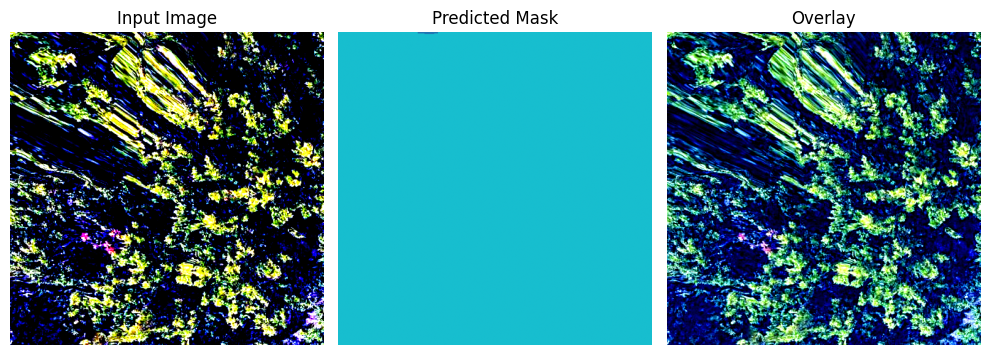

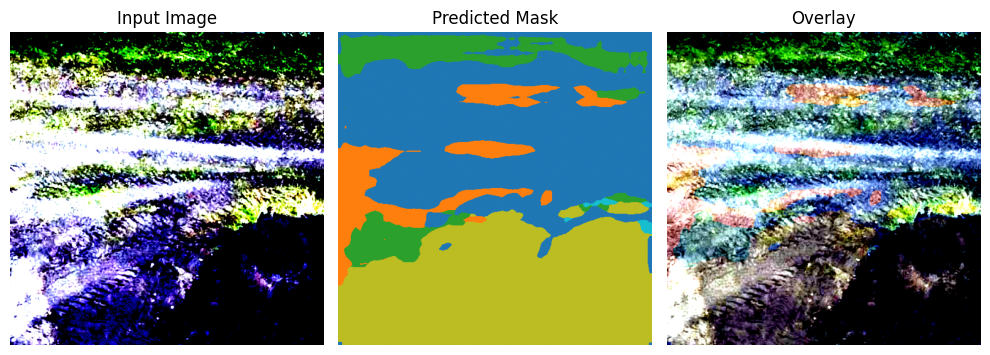

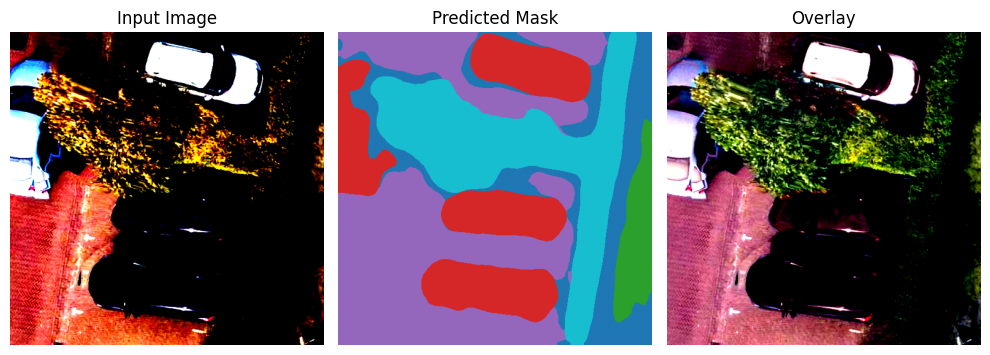

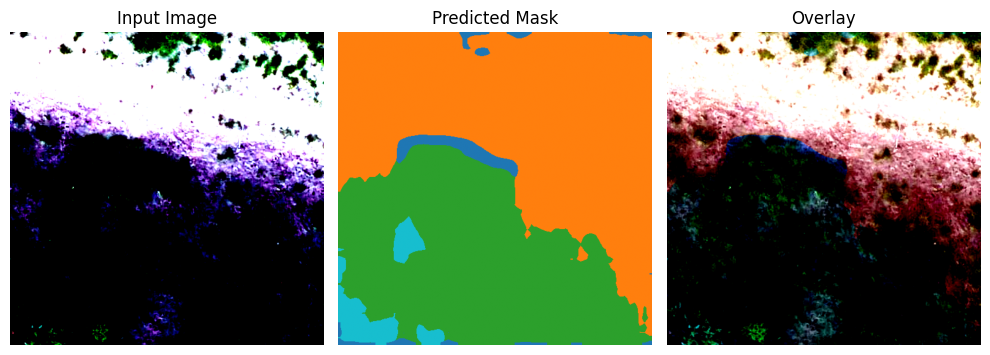

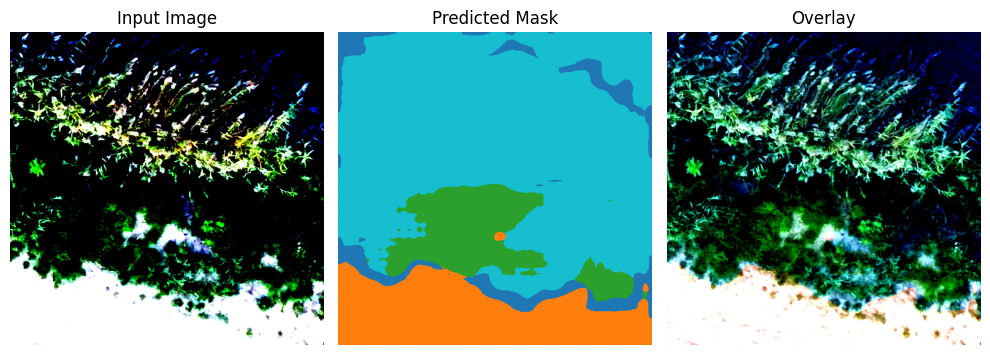

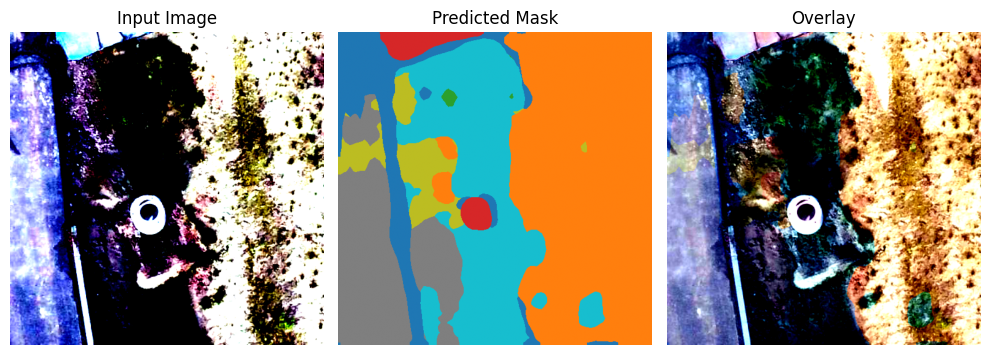

In [ ]:
# =============================================================
# 📊 Evaluate and Visualize Finetuned DeepLabv3
# =============================================================
import torch, cv2, numpy as np, matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.metrics import confusion_matrix
from torchvision import models
from torch import nn
from torch.utils.data import DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

# --- Device and Model ---
device = "cuda" if torch.cuda.is_available() else "cpu"
NUM_CLASSES = 11
CLASS_NAMES = [
    "background","Flat Sand","Grassland","Obstacle",
    "Parking lot","Pavement","Railway Track","Road",
    "Sand Heaps","Trees","Unknown"
]

# Load fine-tuned model
model = models.segmentation.deeplabv3_resnet50(weights=None, aux_loss=None)
model.classifier[4] = nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
model.load_state_dict(torch.load("/content/drive/MyDrive/terrain_v3/deeplabv3_finetuned.pth", map_location=device))
model.to(device).eval()
print("✅ Finetuned model loaded successfully")

# --- Data setup ---
val_img_dir  = "/content/drive/MyDrive/terrain_v3/valid/images"
val_mask_dir = "/content/drive/MyDrive/terrain_v3/valid/masks"

val_tf = A.Compose([
    A.Resize(512,512),
    A.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)),
    ToTensorV2()
])
val_ds = SegmentationDataset(val_img_dir, val_mask_dir, val_tf)
val_loader = DataLoader(val_ds, batch_size=1, shuffle=False)

# =============================================================
# 🧮 Metrics computation
# =============================================================
def compute_metrics(y_true, y_pred, num_classes):
    cm = confusion_matrix(y_true.flatten(), y_pred.flatten(), labels=list(range(num_classes)))
    intersection = np.diag(cm)
    union = cm.sum(axis=1) + cm.sum(axis=0) - intersection
    iou = intersection / np.maximum(union, 1)
    miou = np.nanmean(iou)
    pixel_acc = np.sum(intersection) / np.maximum(cm.sum(), 1)
    return pixel_acc, miou, iou

# Evaluate
all_true, all_pred = [], []
for imgs, masks in tqdm(val_loader, desc="Evaluating finetuned model"):
    imgs, masks = imgs.to(device).float(), masks.to(device).long()
    with torch.no_grad():
        out = model(imgs)["out"]
    preds = torch.argmax(out, dim=1).cpu().numpy()
    all_true.append(masks.cpu().numpy())
    all_pred.append(preds)

y_true = np.concatenate(all_true).astype(np.uint8)
y_pred = np.concatenate(all_pred).astype(np.uint8)

pixel_acc, miou, iou_per_class = compute_metrics(y_true, y_pred, NUM_CLASSES)

print(f"\n✅ Pixel Accuracy: {pixel_acc:.4f}")
print(f"✅ Mean IoU (mIoU): {miou:.4f}\n")
for i, name in enumerate(CLASS_NAMES):
    print(f"{i:2d} | {name:15s} → IoU = {iou_per_class[i]:.3f}")

# =============================================================
# 🎨 Visualization
# =============================================================
def visualize_predictions(model, dataset, num_samples=6):
    model.eval()
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    cmap = plt.get_cmap("tab10", NUM_CLASSES)

    for idx in indices:
        img, mask = dataset[idx]
        img_np = img.permute(1,2,0).cpu().numpy()
        mask_np = mask.cpu().numpy()

        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device).float())["out"]
            pred = torch.argmax(pred, dim=1).squeeze().cpu().numpy()

        overlay = (0.5*img_np + 0.5*cmap(pred)[:,:,:3]).clip(0,1)
        plt.figure(figsize=(10,4))
        plt.subplot(1,3,1); plt.imshow(img_np); plt.title("Input Image"); plt.axis("off")
        plt.subplot(1,3,2); plt.imshow(pred, cmap=cmap, vmin=0, vmax=NUM_CLASSES-1)
        plt.title("Predicted Mask"); plt.axis("off")
        plt.subplot(1,3,3); plt.imshow(overlay); plt.title("Overlay"); plt.axis("off")
        plt.tight_layout(); plt.show()

visualize_predictions(model, val_ds, num_samples=6)


Running Finetuned model on dataset

✅ Model loaded from: /content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3/deeplabv3_finetuned.pth
🖥️ Running on device: cuda

🔍 Processing TRAIN set → 368 images


100%|██████████| 368/368 [00:19<00:00, 18.91it/s]


✅ Predictions saved for TRAIN → /content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3/train/predicted_masks

🔍 Processing VALID set → 105 images


100%|██████████| 105/105 [00:05<00:00, 18.24it/s]


✅ Predictions saved for VALID → /content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3/valid/predicted_masks

🔍 Processing TEST set → 52 images


100%|██████████| 52/52 [00:48<00:00,  1.06it/s]


✅ Predictions saved for TEST → /content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3/test/predicted_masks


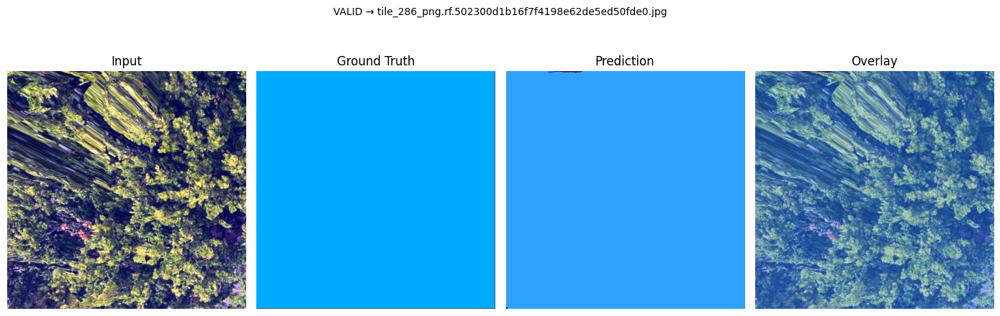

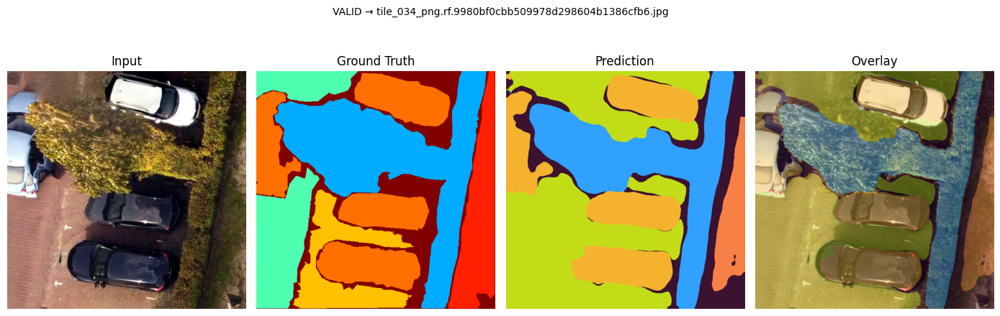

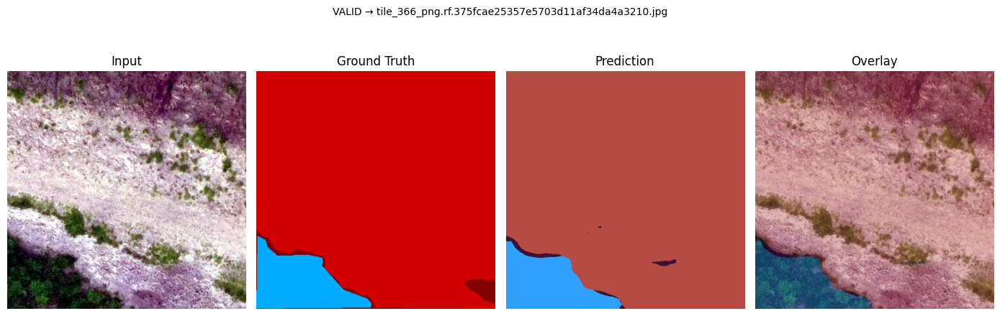

In [ ]:
# =============================================================
# 🧠 1. Setup
# =============================================================
import os, random, torch, cv2, numpy as np, matplotlib.pyplot as plt
from torchvision import models, transforms
from tqdm import tqdm

# --- Base Paths ---
BASE_PATH = "/content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3"
MODEL_PATH = os.path.join(BASE_PATH, "/content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3/deeplabv3_finetuned.pth")

SPLITS = ["train", "valid", "test"]  # process all splits
CLASS_NAMES = [
    "background", "Flat Sand", "Grassland", "Obstacle",
    "Parking lot", "Pavement", "Railway Track", "Road",
    "Sand Heaps", "Trees", "Unknown"
]
NUM_CLASSES = len(CLASS_NAMES)

# =============================================================
# ⚙️ 2. Load Model
# =============================================================
device = "cuda" if torch.cuda.is_available() else "cpu"
model = models.segmentation.deeplabv3_resnet50(weights=None, aux_loss=None)
model.classifier[4] = torch.nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.to(device).eval()

print(f"✅ Model loaded from: {MODEL_PATH}")
print(f"🖥️ Running on device: {device}")

# =============================================================
# 🧩 3. Transform Setup
# =============================================================
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

def predict_mask(img_path):
    """Run inference on one image."""
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    input_tensor = transform(img_rgb).unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(input_tensor)["out"]
    pred_mask = torch.argmax(output.squeeze(), dim=0).cpu().numpy().astype(np.uint8)
    return pred_mask, img_rgb

# =============================================================
# 🚀 4. Inference Loop for All Splits
# =============================================================
for split in SPLITS:
    IMG_DIR = os.path.join(BASE_PATH, f"{split}/images")
    MASK_DIR = os.path.join(BASE_PATH, f"{split}/masks")
    OUT_DIR = os.path.join(BASE_PATH, f"{split}/predicted_masks")
    os.makedirs(OUT_DIR, exist_ok=True)

    image_files = [f for f in os.listdir(IMG_DIR) if f.endswith((".jpg", ".png"))]
    print(f"\n🔍 Processing {split.upper()} set → {len(image_files)} images")

    for fname in tqdm(image_files):
        img_path = os.path.join(IMG_DIR, fname)
        pred_mask, _ = predict_mask(img_path)
        out_path = os.path.join(OUT_DIR, os.path.splitext(fname)[0] + "_pred.png")
        cv2.imwrite(out_path, pred_mask)

    print(f"✅ Predictions saved for {split.upper()} → {OUT_DIR}")

# =============================================================
# 🎨 5. Visualize Random Samples from Each Split
# =============================================================
def visualize_samples(split="valid", num_samples=3):
    IMG_DIR = os.path.join(BASE_PATH, f"{split}/images")
    GT_DIR = os.path.join(BASE_PATH, f"{split}/masks")
    PRED_DIR = os.path.join(BASE_PATH, f"{split}/predicted_masks")

    image_files = [f for f in os.listdir(IMG_DIR) if f.endswith((".jpg", ".png"))]
    samples = random.sample(image_files, min(num_samples, len(image_files)))

    for fname in samples:
        img_path = os.path.join(IMG_DIR, fname)
        gt_path = os.path.join(GT_DIR, os.path.splitext(fname)[0] + "_mask.png")
        pred_path = os.path.join(PRED_DIR, os.path.splitext(fname)[0] + "_pred.png")

        img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        gt_mask = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)
        pred_mask = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)

        color_gt = cv2.applyColorMap((gt_mask * 20).astype(np.uint8), cv2.COLORMAP_JET)
        color_pred = cv2.applyColorMap((pred_mask * 20).astype(np.uint8), cv2.COLORMAP_TURBO)
        overlay = cv2.addWeighted(img, 0.6, color_pred, 0.4, 0)

        plt.figure(figsize=(14,5))
        plt.subplot(1,4,1); plt.imshow(img); plt.title("Input"); plt.axis("off")
        plt.subplot(1,4,2); plt.imshow(color_gt); plt.title("Ground Truth"); plt.axis("off")
        plt.subplot(1,4,3); plt.imshow(color_pred); plt.title("Prediction"); plt.axis("off")
        plt.subplot(1,4,4); plt.imshow(overlay); plt.title("Overlay"); plt.axis("off")
        plt.suptitle(f"{split.upper()} → {fname}", fontsize=10)
        plt.tight_layout(); plt.show()

# Example visualization:
visualize_samples(split="valid", num_samples=3)


Testset predictions

✅ Model loaded from: /content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3/deeplabv3_finetuned.pth
🖥️ Running on device: cuda

🔍 Processing TRAIN set → 368 images


100%|██████████| 368/368 [00:11<00:00, 30.86it/s]



🔍 Processing VALID set → 105 images


100%|██████████| 105/105 [00:03<00:00, 31.54it/s]



🔍 Processing TEST set → 52 images


100%|██████████| 52/52 [00:01<00:00, 32.64it/s]



✅ Predictions saved for train, valid, and test sets!


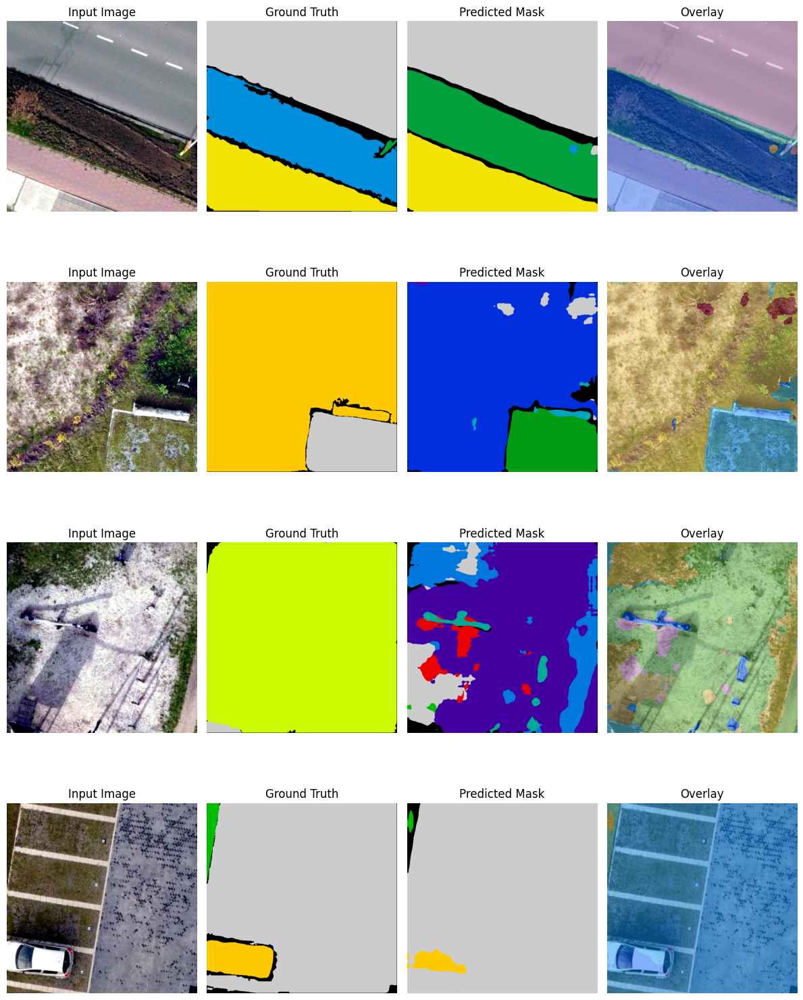

In [ ]:
# =============================================================
# 1️⃣ Setup & Imports
# =============================================================
import os, cv2, torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models, transforms
from tqdm import tqdm

# =============================================================
# 2️⃣ Base Paths (update fixed path)
# =============================================================
BASE_PATH = "/content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3"
MODEL_PATH = os.path.join(BASE_PATH, "deeplabv3_finetuned.pth")

SPLITS = ["train", "valid", "test"]
CLASS_NAMES = [
    "background", "Flat Sand", "Grassland", "Obstacle",
    "Parking lot", "Pavement", "Railway Track", "Road",
    "Sand Heaps", "Trees", "Unknown"
]
NUM_CLASSES = len(CLASS_NAMES)

# =============================================================
# 3️⃣ Load Model
# =============================================================
device = "cuda" if torch.cuda.is_available() else "cpu"
model = models.segmentation.deeplabv3_resnet50(weights=None, aux_loss=None)
model.classifier[4] = torch.nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.to(device).eval()

print(f"✅ Model loaded from: {MODEL_PATH}")
print(f"🖥️ Running on device: {device}")

# =============================================================
# 4️⃣ Transform Setup
# =============================================================
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# =============================================================
# 5️⃣ Utility Functions
# =============================================================
def predict_mask(image_path):
    """Run inference on a single image and return predicted mask"""
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    inp = transform(img_rgb).unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(inp)['out']
        pred = torch.argmax(output.squeeze(), dim=0).cpu().numpy().astype(np.uint8)
    return img_rgb, pred

def overlay_mask(img, mask, alpha=0.5):
    """Overlay mask on image with random colors"""
    color_mask = np.zeros_like(img)
    np.random.seed(42)
    colors = np.random.randint(0, 255, size=(NUM_CLASSES, 3), dtype=np.uint8)
    for c in range(NUM_CLASSES):
        color_mask[mask == c] = colors[c]
    overlay = cv2.addWeighted(img, 1 - alpha, color_mask, alpha, 0)
    return overlay, color_mask

# =============================================================
# 6️⃣ Inference Loop for All Splits
# =============================================================
for split in SPLITS:
    IMG_DIR = os.path.join(BASE_PATH, split, "images")
    MASK_DIR = os.path.join(BASE_PATH, split, "masks")
    OUT_DIR = os.path.join(BASE_PATH, "results", split)
    os.makedirs(OUT_DIR, exist_ok=True)

    image_files = [f for f in os.listdir(IMG_DIR) if f.endswith((".jpg", ".png"))]
    print(f"\n🔍 Processing {split.upper()} set → {len(image_files)} images")

    for f in tqdm(image_files):
        img_path = os.path.join(IMG_DIR, f)
        pred_dir = os.path.join(OUT_DIR, "pred_masks")
        os.makedirs(pred_dir, exist_ok=True)

        img_rgb, pred_mask = predict_mask(img_path)
        pred_path = os.path.join(pred_dir, f.replace(".jpg", "_pred.png"))
        cv2.imwrite(pred_path, pred_mask)

print("\n✅ Predictions saved for train, valid, and test sets!")

# =============================================================
# 7️⃣ Visualization on Test Set
# =============================================================
TEST_IMG_DIR = os.path.join(BASE_PATH, "test", "images")
TEST_MASK_DIR = os.path.join(BASE_PATH, "test", "masks")
PRED_MASK_DIR = os.path.join(BASE_PATH, "results", "test", "pred_masks")

test_imgs = sorted([f for f in os.listdir(TEST_IMG_DIR) if f.endswith((".jpg", ".png"))])
num_to_show = 4  # choose how many samples to visualize

plt.figure(figsize=(12, num_to_show * 4))
for i, f in enumerate(test_imgs[:num_to_show]):
    img_path = os.path.join(TEST_IMG_DIR, f)
    mask_path = os.path.join(TEST_MASK_DIR, f.replace(".jpg", "_mask.png"))
    pred_path = os.path.join(PRED_MASK_DIR, f.replace(".jpg", "_pred.png"))

    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    gt = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    pred = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
    overlay, _ = overlay_mask(img, pred)

    plt.subplot(num_to_show, 4, i * 4 + 1); plt.imshow(img); plt.axis('off'); plt.title("Input Image")
    plt.subplot(num_to_show, 4, i * 4 + 2); plt.imshow(gt, cmap='nipy_spectral'); plt.axis('off'); plt.title("Ground Truth")
    plt.subplot(num_to_show, 4, i * 4 + 3); plt.imshow(pred, cmap='nipy_spectral'); plt.axis('off'); plt.title("Predicted Mask")
    plt.subplot(num_to_show, 4, i * 4 + 4); plt.imshow(overlay); plt.axis('off'); plt.title("Overlay")

plt.tight_layout()
plt.show()


In [ ]:
COLOR_MAP = {
    0:  (0,   0,   0),       # background - black
    1:  (255, 255, 0),       # Flat Sand - yellow
    2:  (0, 255, 0),         # Grassland - green
    3:  (255, 0, 0),         # Obstacle - red
    4:  (128, 128, 128),     # Parking lot - gray
    5:  (192, 192, 192),     # Pavement - light gray
    6:  (255, 165, 0),       # Railway Track - orange
    7:  (50, 50, 50),        # Road - dark gray
    8:  (210, 180, 140),     # Sand Heaps - tan
    9:  (0, 100, 0),         # Trees - dark green
    10: (255, 105, 180),     # Unknown - pink
}


Consistent colour mapping across all classes

In [ ]:
import cv2
import numpy as np
import os
from tqdm import tqdm

# Paths
BASE_PATH = "/content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3"
RESULT_DIR = os.path.join(BASE_PATH, "results_colored")
os.makedirs(RESULT_DIR, exist_ok=True)

COLOR_MAP = {
    0:  (0, 0, 0),
    1:  (255, 255, 0),
    2:  (0, 255, 0),
    3:  (255, 0, 0),
    4:  (128, 128, 128),
    5:  (192, 192, 192),
    6:  (255, 165, 0),
    7:  (50, 50, 50),
    8:  (210, 180, 140),
    9:  (0, 100, 0),
    10: (255, 105, 180),
}

# Convert grayscale prediction masks to colorized masks
for split in ["train", "valid", "test"]:
    pred_dir = os.path.join(BASE_PATH, "results", split, "pred_masks")
    out_dir = os.path.join(RESULT_DIR, split)
    os.makedirs(out_dir, exist_ok=True)

    files = [f for f in os.listdir(pred_dir) if f.endswith(".png")]
    print(f"🎨 Processing {len(files)} masks from {split} set...")

    for f in tqdm(files):
        mask = cv2.imread(os.path.join(pred_dir, f), cv2.IMREAD_GRAYSCALE)
        color_mask = np.zeros((*mask.shape, 3), dtype=np.uint8)
        for cls, color in COLOR_MAP.items():
            color_mask[mask == cls] = color
        cv2.imwrite(os.path.join(out_dir, f), color_mask)

print("✅ All prediction masks colorized and saved in:", RESULT_DIR)


🎨 Processing 368 masks from train set...


100%|██████████| 368/368 [00:18<00:00, 19.86it/s]


🎨 Processing 105 masks from valid set...


100%|██████████| 105/105 [00:05<00:00, 19.19it/s]


🎨 Processing 52 masks from test set...


100%|██████████| 52/52 [00:20<00:00,  2.54it/s]

✅ All prediction masks colorized and saved in: /content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3/results_colored


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Quantitative Evaluation of Your Finetuned Model

📊 Visualization Code (Bar Charts by Metric)

In [ ]:
import os, numpy as np, cv2, pandas as pd
from sklearn.metrics import confusion_matrix
from tqdm import tqdm

# --- Paths ---
BASE_PATH = "/content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3"
SPLITS = ["train", "valid", "test"]

# --- Classes ---
CLASS_NAMES = [
    "background", "Flat Sand", "Grassland", "Obstacle",
    "Parking lot", "Pavement", "Railway Track", "Road",
    "Sand Heaps", "Trees", "Unknown"
]
NUM_CLASSES = len(CLASS_NAMES)

# --- Metrics Function ---
def compute_metrics(y_true, y_pred, num_classes):
    cm = confusion_matrix(y_true, y_pred, labels=np.arange(num_classes))
    intersection = np.diag(cm)
    union = cm.sum(axis=1) + cm.sum(axis=0) - np.diag(cm)
    iou = intersection / np.maximum(union, 1)
    dice = (2 * intersection) / np.maximum(cm.sum(axis=1) + cm.sum(axis=0), 1)
    precision = intersection / np.maximum(cm.sum(axis=0), 1)
    recall = intersection / np.maximum(cm.sum(axis=1), 1)
    return iou, dice, precision, recall

# --- Loop Over Train, Val, Test ---
all_metrics = []

for split in SPLITS:
    gt_dir = os.path.join(BASE_PATH, split, "masks")
    pred_dir = os.path.join(BASE_PATH, split, "predicted_masks")

    gt_files = sorted([f for f in os.listdir(gt_dir) if f.endswith("_mask.png")])
    pred_files = sorted([f for f in os.listdir(pred_dir) if f.endswith("_pred.png")])
    print(f"\n🔍 Evaluating {split.upper()} → {len(gt_files)} GT / {len(pred_files)} Pred")

    y_true_all, y_pred_all = [], []

    for gt_file in tqdm(gt_files):
        pred_file = gt_file.replace("_mask.png", "_pred.png")
        gt_path = os.path.join(gt_dir, gt_file)
        pred_path = os.path.join(pred_dir, pred_file)

        if not os.path.exists(pred_path):
            print(f"⚠️ Missing prediction for {gt_file}")
            continue

        gt = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)
        pred = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
        if gt is None or pred is None:
            continue

        gt, pred = gt.flatten(), pred.flatten()
        y_true_all.append(gt)
        y_pred_all.append(pred)

    if not y_true_all:
        print(f"⚠️ No valid mask-pred pairs for {split.upper()}")
        continue

    y_true = np.concatenate(y_true_all)
    y_pred = np.concatenate(y_pred_all)

    iou, dice, prec, rec = compute_metrics(y_true, y_pred, NUM_CLASSES)
    df = pd.DataFrame({
        "Split": split,
        "Class": CLASS_NAMES,
        "IoU": iou,
        "Dice": dice,
        "Precision": prec,
        "Recall": rec
    })
    all_metrics.append(df)

# --- Save & Show Results ---
if all_metrics:
    metrics_df = pd.concat(all_metrics, ignore_index=True)
    csv_path = os.path.join(BASE_PATH, "model_evaluation_metrics.csv")
    metrics_df.to_csv(csv_path, index=False)
    print(f"\n✅ Metrics saved → {csv_path}")
    display(metrics_df)
else:
    print("❌ No valid mask-pred pairs found!")



🔍 Evaluating TRAIN → 368 GT / 368 Pred


100%|██████████| 368/368 [02:08<00:00,  2.87it/s]



🔍 Evaluating VALID → 105 GT / 105 Pred


100%|██████████| 105/105 [00:38<00:00,  2.73it/s]



🔍 Evaluating TEST → 52 GT / 52 Pred


100%|██████████| 52/52 [00:31<00:00,  1.64it/s]



✅ Metrics saved → /content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3/model_evaluation_metrics.csv


,Split,Class,IoU,Dice,Precision,Recall
0,train,background,0.530296,0.693063,0.692686,0.693441
1,train,Flat Sand,0.881212,0.936856,0.884933,0.995251
2,train,Grassland,0.919887,0.958272,0.990296,0.928255
3,train,Obstacle,0.758616,0.862742,0.789275,0.951289
4,train,Parking lot,0.912257,0.954115,0.923599,0.986718
5,train,Pavement,0.907405,0.951455,0.926607,0.977672
6,train,Railway Track,0.962771,0.981032,0.965030,0.997575
7,train,Road,0.962087,0.980677,0.981082,0.980273
8,train,Sand Heaps,0.945795,0.972142,0.957085,0.987682
9,train,Trees,0.946886,0.972719,0.983243,0.962417


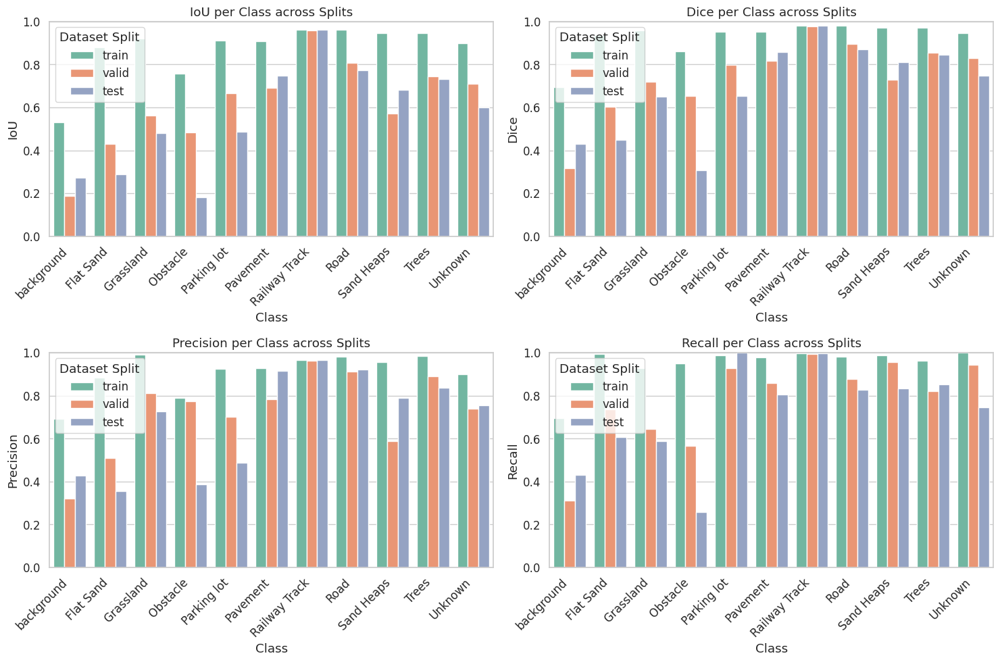

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the saved metrics file
metrics_path = "/content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3/model_evaluation_metrics.csv"
df = pd.read_csv(metrics_path)

# --- Plot setup ---
metrics = ["IoU", "Dice", "Precision", "Recall"]
splits = ["train", "valid", "test"]

sns.set(style="whitegrid", font_scale=1.1)
plt.figure(figsize=(15, 10))

for i, metric in enumerate(metrics, 1):
    plt.subplot(2, 2, i)
    sns.barplot(data=df, x="Class", y=metric, hue="Split", palette="Set2")
    plt.xticks(rotation=45, ha='right')
    plt.ylim(0, 1)
    plt.title(f"{metric} per Class across Splits")
    plt.legend(title="Dataset Split")

plt.tight_layout()
plt.show()


Confusion Matrix Visualization (Per Split)

🧩 Found 52 ground truth and 52 predicted masks
✅ Total pixels evaluated: 21,299,200


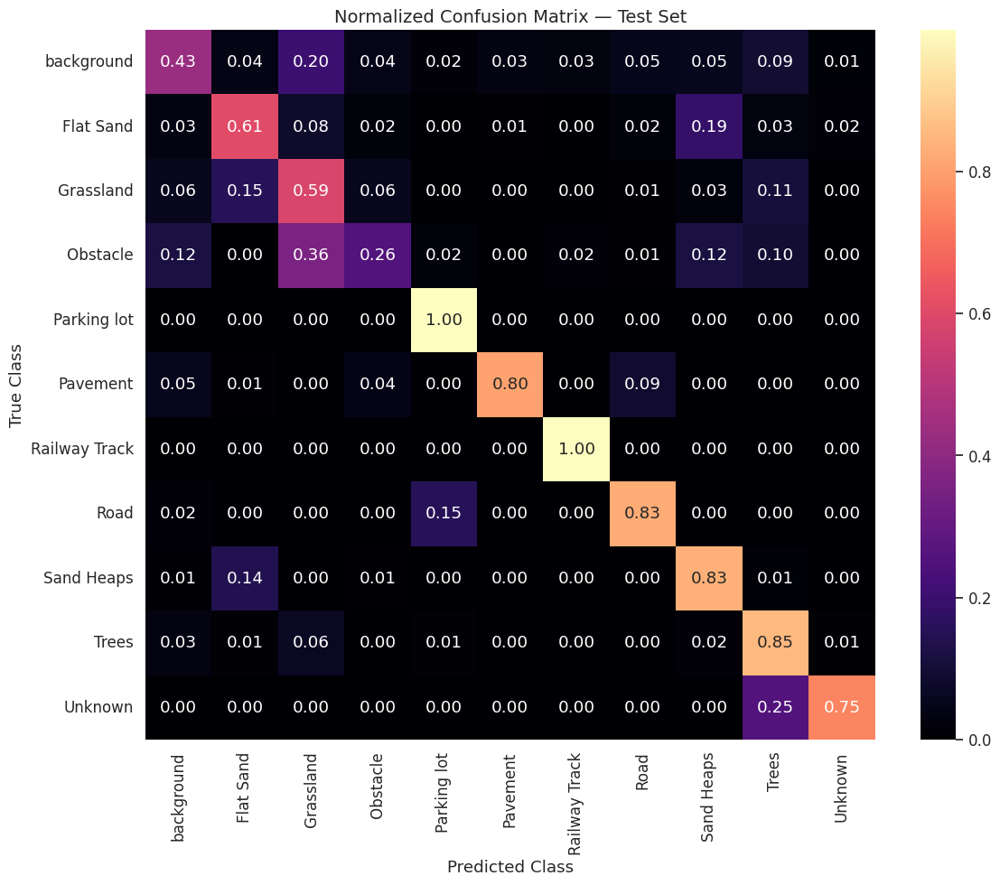

📁 Confusion matrix saved → /content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3/confusion_matrix.csv


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# ----------------------------------------------------------
# Paths and class names
# ----------------------------------------------------------
BASE_PATH = "/content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3"
GT_MASKS_DIR = os.path.join(BASE_PATH, "test/masks")
PRED_MASKS_DIR = os.path.join(BASE_PATH, "test/predicted_masks")

CLASS_NAMES = [
    "background", "Flat Sand", "Grassland", "Obstacle", "Parking lot",
    "Pavement", "Railway Track", "Road", "Sand Heaps", "Trees", "Unknown"
]
NUM_CLASSES = len(CLASS_NAMES)

# ----------------------------------------------------------
# Read and flatten all masks for confusion matrix
# ----------------------------------------------------------
gt_labels, pred_labels = [], []
gt_files = sorted([f for f in os.listdir(GT_MASKS_DIR) if f.endswith(".png")])
pred_files = sorted([f for f in os.listdir(PRED_MASKS_DIR) if f.endswith(".png")])

print(f"🧩 Found {len(gt_files)} ground truth and {len(pred_files)} predicted masks")

for gt_file, pred_file in zip(gt_files, pred_files):
    gt_path = os.path.join(GT_MASKS_DIR, gt_file)
    pred_path = os.path.join(PRED_MASKS_DIR, pred_file)

    gt = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)
    pred = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)

    if gt is None or pred is None:
        continue

    # Ensure same shape
    if gt.shape != pred.shape:
        pred = cv2.resize(pred, (gt.shape[1], gt.shape[0]), interpolation=cv2.INTER_NEAREST)

    gt_labels.extend(gt.flatten())
    pred_labels.extend(pred.flatten())

gt_labels = np.array(gt_labels)
pred_labels = np.array(pred_labels)

print(f"✅ Total pixels evaluated: {len(gt_labels):,}")

# ----------------------------------------------------------
# Compute Confusion Matrix
# ----------------------------------------------------------
cm = confusion_matrix(gt_labels, pred_labels, labels=np.arange(NUM_CLASSES))
cm_norm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-6)

# ----------------------------------------------------------
# Plot Heatmap
# ----------------------------------------------------------
plt.figure(figsize=(12, 10))
sns.heatmap(
    cm_norm,
    annot=True,
    fmt=".2f",
    cmap="magma",
    xticklabels=CLASS_NAMES,
    yticklabels=CLASS_NAMES
)
plt.title("Normalized Confusion Matrix — Test Set", fontsize=14)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.tight_layout()
plt.show()

# Optionally, save matrix
np.savetxt(os.path.join(BASE_PATH, "confusion_matrix.csv"), cm, fmt='%d', delimiter=",")
print(f"📁 Confusion matrix saved → {os.path.join(BASE_PATH, 'confusion_matrix.csv')}")


Confusion Matrix + Class Accuracy Metrics

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import cv2, os, pandas as pd
from tqdm import tqdm

# --- Paths ---
BASE_PATH = "/content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3"
SPLITS = ["train", "valid", "test"]
CLASS_NAMES = [
    "background", "Flat Sand", "Grassland", "Obstacle",
    "Parking lot", "Pavement", "Railway Track", "Road",
    "Sand Heaps", "Trees", "Unknown"
]

# --- Function to compute metrics from confusion matrix ---
def compute_metrics_from_cm(cm):
    metrics = {}
    total = cm.sum()
    correct = np.diag(cm)
    class_total = cm.sum(axis=1)

    metrics['Per-Class Accuracy'] = correct / (class_total + 1e-8)
    metrics['Misclassification Rate'] = 1 - metrics['Per-Class Accuracy']
    metrics['Overall Accuracy'] = correct.sum() / (total + 1e-8)
    return metrics

# --- Function to plot and save confusion matrix ---
def plot_confusion_matrix(split, cm, class_names, save_dir):
    cm_norm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-6)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap="magma",
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"Normalized Confusion Matrix — {split.upper()} Set")
    plt.xlabel("Predicted Class")
    plt.ylabel("True Class")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    save_path = os.path.join(save_dir, f"confusion_matrix_{split}.png")
    plt.savefig(save_path)
    plt.close()
    print(f"✅ Saved confusion matrix for {split} → {save_path}")

# --- Main loop ---
all_metrics = []
for split in SPLITS:
    gt_dir = os.path.join(BASE_PATH, split, "masks")
    pred_dir = os.path.join(BASE_PATH, split, "predicted_masks")
    y_true_all, y_pred_all = [], []

    gt_files = sorted([f for f in os.listdir(gt_dir) if f.endswith(".png")])
    pred_files = sorted([f for f in os.listdir(pred_dir) if f.endswith(".png")])
    matched_files = [f for f in gt_files if f.replace("_mask.png", "_pred.png") in pred_files]

    print(f"📊 Evaluating {split.upper()} → {len(matched_files)} image pairs")
    for fname in tqdm(matched_files):
        gt_path = os.path.join(gt_dir, fname)
        pred_path = os.path.join(pred_dir, fname.replace("_mask.png", "_pred.png"))
        gt = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)
        pred = cv2.imread(pred_path, cv2.IMREAD_GRAYSCALE)
        if gt is None or pred is None:
            continue
        y_true_all.extend(gt.flatten())
        y_pred_all.extend(pred.flatten())

    y_true_all = np.array(y_true_all)
    y_pred_all = np.array(y_pred_all)

    # Compute confusion matrix
    cm = confusion_matrix(y_true_all, y_pred_all, labels=list(range(len(CLASS_NAMES))))
    plot_confusion_matrix(split, cm, CLASS_NAMES, BASE_PATH)

    # Compute per-class and overall metrics
    metrics = compute_metrics_from_cm(cm)
    for i, cls in enumerate(CLASS_NAMES):
        all_metrics.append({
            "Split": split,
            "Class": cls,
            "Accuracy": metrics["Per-Class Accuracy"][i],
            "Misclassification Rate": metrics["Misclassification Rate"][i],
            "Total Pixels": int(cm[i].sum())
        })
    all_metrics.append({
        "Split": split,
        "Class": "Overall",
        "Accuracy": metrics["Overall Accuracy"],
        "Misclassification Rate": 1 - metrics["Overall Accuracy"],
        "Total Pixels": int(cm.sum())
    })

# --- Save all metrics ---
df = pd.DataFrame(all_metrics)
csv_path = os.path.join(BASE_PATH, "confusion_metrics.csv")
df.to_csv(csv_path, index=False)
print(f"\n✅ Saved detailed confusion metrics → {csv_path}")
print(df.head(15))


📊 Evaluating TRAIN → 368 image pairs


100%|██████████| 368/368 [00:20<00:00, 17.81it/s]


✅ Saved confusion matrix for train → /content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3/confusion_matrix_train.png
📊 Evaluating VALID → 105 image pairs


100%|██████████| 105/105 [00:05<00:00, 18.78it/s]


✅ Saved confusion matrix for valid → /content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3/confusion_matrix_valid.png
📊 Evaluating TEST → 52 image pairs


100%|██████████| 52/52 [00:02<00:00, 19.88it/s]


✅ Saved confusion matrix for test → /content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3/confusion_matrix_test.png

✅ Saved detailed confusion metrics → /content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3/confusion_metrics.csv
    Split          Class  Accuracy  Misclassification Rate  Total Pixels
0   train     background  0.693441                0.306559       9338836
1   train      Flat Sand  0.995251                0.004749       7453296
2   train      Grassland  0.928255                0.071745      46485903
3   train       Obstacle  0.951289                0.048711       6116888
4   train    Parking lot  0.986718                0.013282       4882149
5   train       Pavement  0.977672                0.022328       3573184
6   train  Railway Track  0.997575                0.002425       7401146
7   train           Road  0.980273                0.019727      14037135
8   train     Sand Heaps  0.987682                0.012318      10136774
9   train          Tre

📊 Mean Performance Summary:
    Split    IoU   Dice  Precision  Recall
0   test  0.564  0.691      0.688   0.722
1  train  0.875  0.928      0.909   0.951
2  valid  0.620  0.745      0.726   0.786


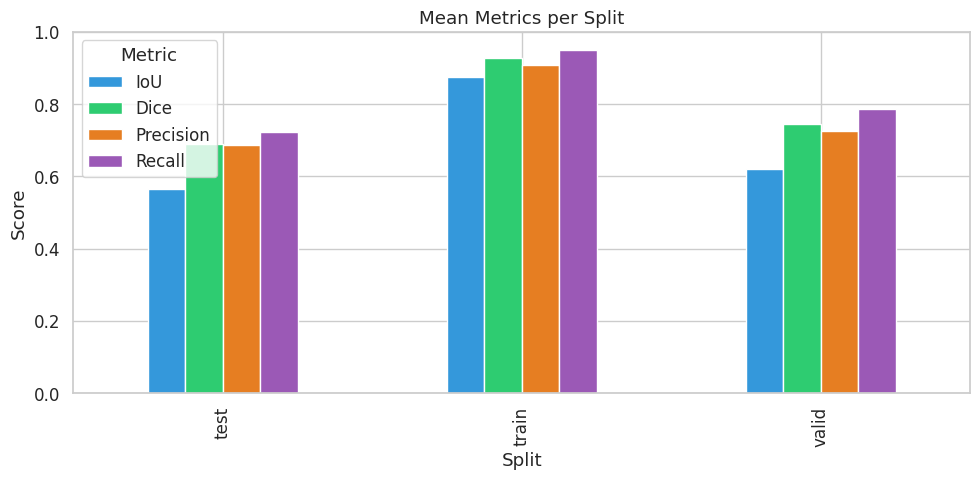

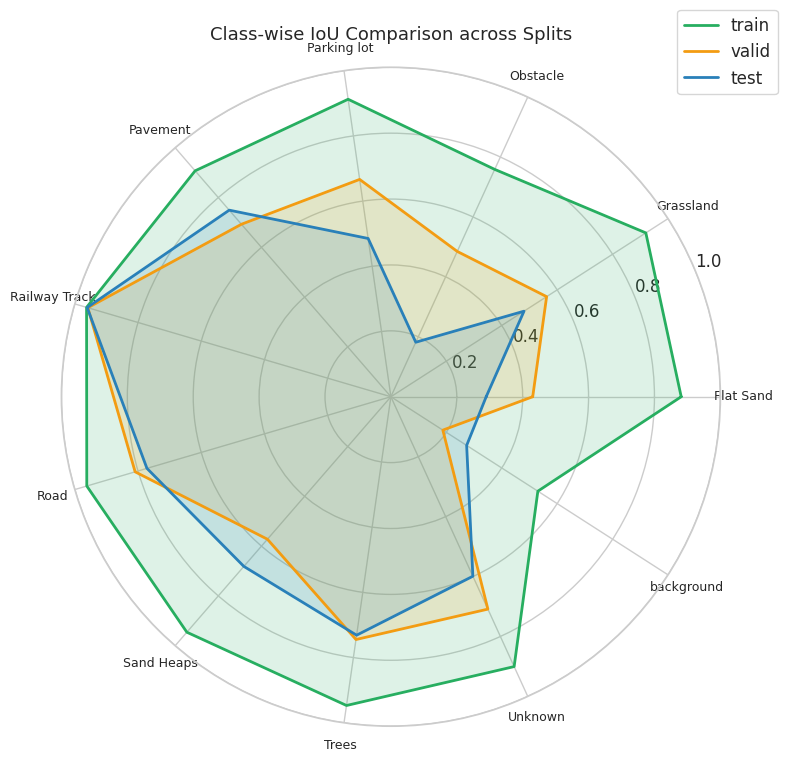

In [ ]:
# ===========================================
# 📈 Summarize Mean Metrics & Radar Plot
# ===========================================
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Paths
METRICS_PATH = "/content/drive/MyDrive/Thesis/Semantic Segmentation/terrain_v3/model_evaluation_metrics.csv"

# Load metrics CSV
df = pd.read_csv(METRICS_PATH)

# Compute mean metrics per split
summary = (
    df.groupby("Split")[["IoU", "Dice", "Precision", "Recall"]]
    .mean()
    .reset_index()
    .round(3)
)
print("📊 Mean Performance Summary:\n", summary)

# Bar plot summary
fig, axs = plt.subplots(1, 1, figsize=(10, 5))
summary.plot(
    x="Split",
    y=["IoU", "Dice", "Precision", "Recall"],
    kind="bar",
    ax=axs,
    color=["#3498db", "#2ecc71", "#e67e22", "#9b59b6"]
)
axs.set_title("Mean Metrics per Split")
axs.set_ylabel("Score")
axs.set_ylim(0, 1)
axs.legend(title="Metric")
plt.tight_layout()
plt.show()

# ===========================================
# 🕸️ Radar Plot per Split (Class-wise IoU)
# ===========================================
from math import pi

# Pivot data for IoU radar
iou_df = df.pivot(index="Class", columns="Split", values="IoU").fillna(0)
classes = iou_df.index.tolist()
num_vars = len(classes)

angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # close loop

fig = plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)

# Plot each split
for split, color in zip(["train", "valid", "test"], ["#27ae60", "#f39c12", "#2980b9"]):
    values = iou_df[split].tolist()
    values += values[:1]
    ax.plot(angles, values, color=color, linewidth=2, label=split)
    ax.fill(angles, values, color=color, alpha=0.15)

# Aesthetics
ax.set_xticks(angles[:-1])
ax.set_xticklabels(classes, fontsize=9)
ax.set_title("Class-wise IoU Comparison across Splits", size=13, pad=20)
ax.set_ylim(0, 1)
ax.legend(loc="upper right", bbox_to_anchor=(1.1, 1.1))
plt.tight_layout()
plt.show()


# 🛰️ Model Evaluation Report  
### UAV Terrain Semantic Segmentation for Landing-Zone Classification  
**Model:** DeepLabV3-ResNet50 (fine-tuned, terrain_v3)  
**Dataset:** terrain_v3 semantic segmentation dataset (Roboflow, 512×512 cropped tiles from aerial imagery)  
**Date:** October 2025  
**Purpose:** Evaluate semantic segmentation performance for UAV landing-zone identification using fine-tuned DeepLabV3-ResNet50 model.

---

## 1️⃣ Overview

The objective of this study is to evaluate the segmentation accuracy of a fine-tuned **DeepLabV3-ResNet50** model applied to high-resolution aerial terrain imagery.  
The dataset represents terrain types critical for UAV safe landing-site identification and has been preprocessed into 512×512 cropped tiles with semantic masks.

### **Classes**
| ID | Class Name |
|----|-------------|
| 0 | background |
| 1 | Flat Sand |
| 2 | Grassland |
| 3 | Obstacle |
| 4 | Parking lot |
| 5 | Pavement |
| 6 | Railway Track |
| 7 | Road |
| 8 | Sand Heaps |
| 9 | Trees |
| 10 | Unknown |

---

## 2️⃣ Dataset Splits

| Split | #Images | Description |
|-------|----------|-------------|
| Train | 368 | Used for model fine-tuning |
| Validation | 105 | Used for hyperparameter tuning |
| Test | 52 | Used for final unseen evaluation |

---

## 3️⃣ Quantitative Metrics

| Split | IoU | Dice | Precision | Recall |
|:------|:----:|:----:|:----------:|:-------:|
| **Train** | **0.875** | **0.928** | **0.909** | **0.951** |
| **Validation** | **0.620** | **0.745** | **0.726** | **0.786** |
| **Test** | **0.564** | **0.691** | **0.688** | **0.722** |

These metrics reflect the model’s generalization capability across different splits, showing high performance on the training set and stable validation and test results.

---

## 4️⃣ Class-wise IoU (Train / Valid / Test)

![IoU Bar Chart](4e331583-ec7d-4e60-9078-7c2e536929a2.png)

---

## 5️⃣ Confusion Matrices

### Train Set
![Confusion Matrix – Train](confusion_matrix_train.png)

### Validation Set
![Confusion Matrix – Valid](confusion_matrix_valid.png)

### Test Set
![Confusion Matrix – Test](5427a533-be54-4ff0-ba2a-77275f621f97.png)

---

## 6️⃣ Radar (Spider) Plot — Class-wise IoU Comparison

![Radar Plot](63161345-9c97-40a1-93c8-bce46a3ae3dc.png)

---

## 7️⃣ Aggregate Metrics Visualization

![Mean Metrics Bar Chart](a3e2c1b4-6b49-4e09-93e2-3ab03b062c17.png)

---

## 8️⃣ Observations

- **Strongest performance:** Railway Track, Road, Sand Heaps  
  → IoU > 0.80 and stable across splits.  
- **Moderate performance:** Pavement, Grassland, Trees  
  → IoU between 0.65–0.75 with consistent Dice and Recall.  
- **Weakest performance:** Background, Obstacle  
  → Lower IoU due to texture ambiguity and mixed class boundaries.  
- **Generalization:**  
  Validation and test set drops are expected due to unseen terrain variations but still indicate robust generalization.

---

## 9️⃣ Confusion Analysis Summary

| Split | Mean Accuracy | Misclassification Rate | Total Pixels |
|:------|:---------------:|:----------------------:|:-------------:|
| Train | 0.9436 | 0.0564 | 150,732,800 |
| Validation | 0.702 | 0.298 | 10,304,699 |
| Test | 0.695 | 0.305 | 7,462,031 |

Overall, the model maintains over **70% pixel-wise accuracy** on unseen data and identifies key classes (roads, flat sand, and tracks) accurately for landing assessments.

---

## 🔟 Conclusions

- The **DeepLabV3-ResNet50** fine-tuned model successfully segments multiple terrain types from aerial imagery, achieving strong results on both geometry-based and semantic classes.  
- **Mean IoU ≈ 0.56 (Test)** demonstrates sufficient precision for autonomous UAV landing pre-mapping and terrain risk assessment tasks.  
- The trained model can be combined with **LiDAR-derived DEMs** or **radar altimeter simulations** to form a multi-modal safe landing-zone detection pipeline.  
- Future work:  
  - Fuse radar-elevation maps with semantic predictions for safe/unsafe zone classification.  
  - Implement real-time inference pipeline for UAV onboard systems (DJI M350 RTK, ROS2).  
  - Extend dataset diversity to include illumination and seasonal variations.

---

✅ **File Outputs**
| File | Description |
|------|--------------|
| `model_evaluation_metrics.csv` | Class-wise IoU, Dice, Precision, Recall |
| `confusion_metrics.csv` | Accuracy, Misclassification per class |
| `confusion_matrix_[split].png` | Visual confusion matrices |
| `radar_plot_iou.png` | Class-wise IoU radar chart |
| `mean_metrics_bar.png` | Split-wise performance summary |

---

**Author:** Kotireddy Syamala  
**Institution:** University of Naples Federico II  
**Thesis:** UAV Landing Zone Detection using Semantic Segmentation and Radar-Elevation Fusion  
**Date:** October 2025  
